<span style="font-family:Papyrus; font-size:2.5em;">Generative Adversarial Networks (GANs)</span>
---
![](https://espresso-jobs.com/conseils-carriere/wp-content/uploads/2019/05/monalisa.gif)
<br>

# Introduction

- Generative Adversarial Networks (GANs)
- How GANs Work
- GANs Process
- Examples

### Generative Adversarial Networks (GANs)

Generative Adversarial Networks are used to generate images that never existed before. They learn about the world (objects, animals and so forth) and create new versions of those images that never existed.

They have two components:

- A **Generator** - this creates the images.
- A **Discriminator** - this assesses the images and tells the generator if they are similar to what it has been trained on. These are based off real world examples.

When training the network, both the generator and discriminator start from scratch and learn together.

### How GANs Work


**G** for **Generative** - this is a model that takes an input as a random noise singal and then outputs an image.

![](https://camo.githubusercontent.com/a2c5a0db812c0ade199e5ccacf86c6cff4db1685/68747470733a2f2f61636975732e636f2e756b2f77702d636f6e74656e742f7468656d65732f61636975732f6d616368696e655f6c6561726e696e672f696d67732f63762f67656e657261746976652e706e67)

**A** for **Adversarial** - this is the discriminator, the opponent of the generator. This is capable of learning about objects, animals or other features specified. For example: if you supply it with pictures of dogs and non-dogs, it would be able to identify the difference between the two.

![](https://camo.githubusercontent.com/96c8ccb9a91b8789106c1b3dfc9d62dde9d3cbe1/68747470733a2f2f61636975732e636f2e756b2f77702d636f6e74656e742f7468656d65732f61636975732f6d616368696e655f6c6561726e696e672f696d67732f63762f6469736372696d696e61746f722d6578616d706c652e706e67)

Using this example, once the discriminator has been trained, showing the discriminator a picture that isn't a dog it will return a 0. Whereas, if you show it a dog it will return a 1.

![](https://camo.githubusercontent.com/8b5978b05b5ab4cd9bfba4819a0f0e09a12c8068/68747470733a2f2f61636975732e636f2e756b2f77702d636f6e74656e742f7468656d65732f61636975732f6d616368696e655f6c6561726e696e672f696d67732f63762f6469736372696d696e61746f722d73636f7265732e706e67)

**N** for **Network** - meaning the generator and discriminator are both neural networks.


### GANs Process

**Step 1** - we input a random noise signal into the generator. The generator creates some images which is used for training the discriminator. We provide the discriminator with some features/images we want it to learn and the discriminator outputs probabilities. These probabilities can be rather high as the discriminator has only just started being trained. The values are then assessed and identified. The error is calculated and these are backpropagated through the discriminator, where the weights are updated.

![](https://camo.githubusercontent.com/a26a06e2437514df1bbd736480f06a86aabebef8/68747470733a2f2f61636975732e636f2e756b2f77702d636f6e74656e742f7468656d65732f61636975732f6d616368696e655f6c6561726e696e672f696d67732f63762f73746570312d6469736372696d696e61746f722e706e67)

Next we train the generator. We take the batch of images that it created and put them through the discriminator again. We do not include the feature images. The generator learns by tricking the discriminator into it outputting false positives.

The discriminator will provide an output of probabilities. The values are then assessed and compared to what they should have been. The error is calculated and backpropagated through the generator and the weights are updated.

![](https://camo.githubusercontent.com/07a68fab0dbea632b29d6186e298a6c05333497c/68747470733a2f2f61636975732e636f2e756b2f77702d636f6e74656e742f7468656d65732f61636975732f6d616368696e655f6c6561726e696e672f696d67732f63762f73746570312d67656e657261746f722e706e67)

**Step 2** - This is the same as step 1 but the generator and discriminator are trained a little more. Through backpropagation the generator understands its mistakes and starts to make them more like the feature.

This is created through a *Deconvolutional Neural Network*.

### Examples

**GANs** can be used for the following:

- Generating Images
- Image Modification
- Super Resolution
- Assisting Artists
- Photo-Realistic Images
- Speech Generation
- Face Ageing



In [1]:
import os
print(os.listdir("../input/car_dataset/"))

['Img (54).jpg', 'Img (379).jpg', 'Img (483).jpg', 'Img (16).jpg', 'Img (388).jpg', 'Img (17).jpg', 'Img (4).jpg', 'Img (381).jpg', 'Img (118).jpg', 'Img (575).jpg', 'Img (448).jpg', 'Img (107).jpg', 'Img (223).jpg', 'Img (150).jpg', 'Img (368).jpg', 'Img (11).jpg', 'Img (486).jpg', 'Img (35).jpg', 'Img (86).jpg', 'Img (218).jpg', 'Img (459).jpg', 'Img (214).jpg', 'Img (8).jpg', 'Img (437).jpg', 'Img (177).jpg', 'Img (564).jpg', 'Img (240).jpg', 'Img (412).jpg', 'Img (519).jpg', 'Img (2).jpg', 'Img (179).jpg', 'Img (614).jpg', 'Img (94).jpg', 'Img (339).jpg', 'Img (98).jpg', 'Img (109).jpg', 'Img (105).jpg', 'Img (391).jpg', 'Img (441).jpg', 'Img (568).jpg', 'Img (579).jpg', 'Img (476).jpg', 'Img (484).jpg', 'Img (277).jpg', 'Img (532).jpg', 'Img (192).jpg', 'Img (294).jpg', 'Img (122).jpg', 'Img (529).jpg', 'Img (30).jpg', 'Img (497).jpg', 'Img (181).jpg', 'Img (384).jpg', 'Img (262).jpg', 'Img (445).jpg', 'Img (549).jpg', 'Img (72).jpg', 'Img (15).jpg', 'Img (547).jpg', 'Img (612).jp

**Importing the libraries**

In [2]:
from __future__ import print_function
import time
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
from torch.autograd import Variable
import matplotlib.pyplot as plt
import numpy as np
from torch import nn, optim
import torch.nn.functional as F
from torchvision import datasets, transforms
from torchvision.utils import save_image
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from tqdm import tqdm_notebook as tqdm

[](http://)## Some Cars

> The Cars dataset contains 620 images of 4 different brands.

There are 621 pictures of cars.


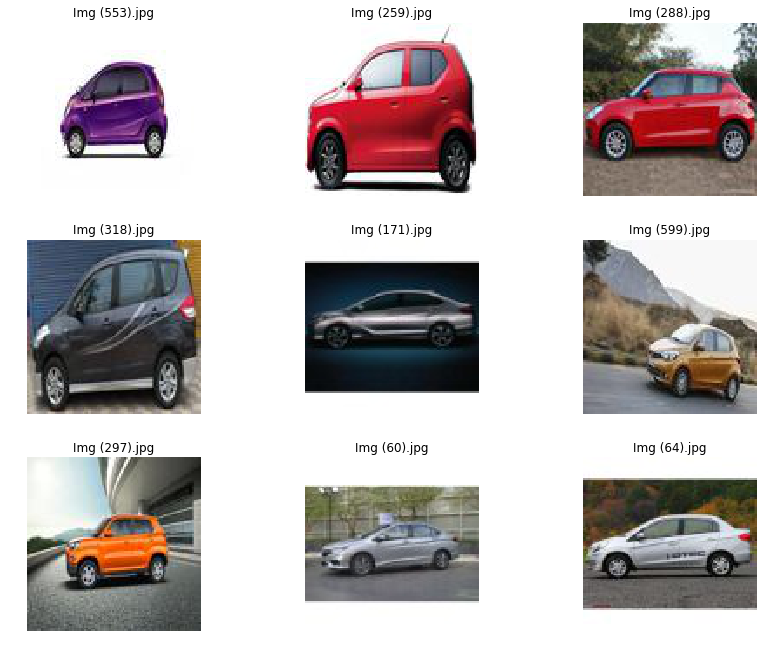

In [3]:
PATH = '../input/car_dataset/'
images = os.listdir(PATH)
print(f'There are {len(os.listdir(PATH))} pictures of cars.')

fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(12,10))

for indx, axis in enumerate(axes.flatten()):
    rnd_indx = np.random.randint(0, len(os.listdir(PATH)))
    # https://matplotlib.org/users/image_tutorial.html
    img = plt.imread(PATH + images[rnd_indx])
    imgplot = axis.imshow(img)
    axis.set_title(images[rnd_indx])
    axis.set_axis_off()
plt.tight_layout(rect=[0, 0.03, 1, 0.95])

**Initial code ...**

```
batch_size = 32
imageSize = 100

# 64x64 images!
transform = transforms.Compose([transforms.Resize(64),
                                transforms.CenterCrop(64),
                                transforms.ToTensor(),
                                transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])

train_data = datasets.ImageFolder('../input/', transform=transform)

dataloader = torch.utils.data.DataLoader(train_data, shuffle=True,
                                           batch_size=batch_size)

imgs, label = next(iter(dataloader))
imgs = imgs.numpy().transpose(0, 2, 3, 1)

```

**New data Data loader and Augmentations from [RaLSGAN dogs](https://www.kaggle.com/speedwagon/ralsgan-dogs)**

In [4]:
batch_size = 32
image_size = 100

random_transforms = [transforms.ColorJitter(), transforms.RandomRotation(degrees=20)]
transform = transforms.Compose([transforms.Resize(64),
                                transforms.CenterCrop(64),
                                transforms.RandomHorizontalFlip(p=0.5),
                                transforms.RandomApply(random_transforms, p=0.2),
                                transforms.ToTensor(),
                                transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])

train_data = datasets.ImageFolder('../input/', transform=transform)
train_loader = torch.utils.data.DataLoader(train_data, shuffle=True,
                                           batch_size=batch_size)
                                           
imgs, label = next(iter(train_loader))
imgs = imgs.numpy().transpose(0, 2, 3, 1)

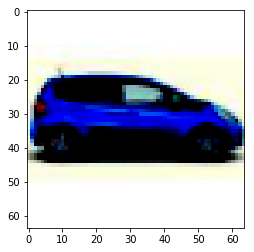

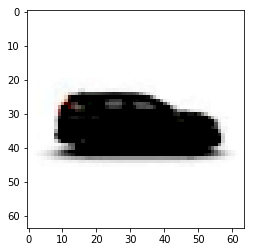

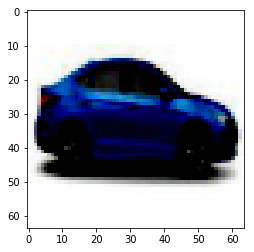

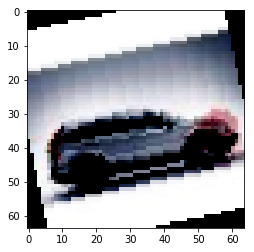

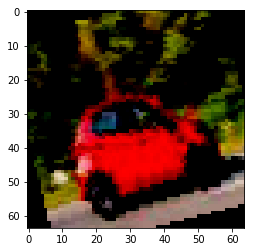

In [5]:
for i in range(5):
    plt.imshow(imgs[i])
    plt.show()

# Weights
### Defining the weights_init function

In [6]:
def weights_init(m):
    """
    Takes as input a neural network m that will initialize all its weights.
    """
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        m.weight.data.normal_(0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        m.weight.data.normal_(1.0, 0.02)
        m.bias.data.fill_(0)

# Generator

In [7]:
class G(nn.Module):
    def __init__(self):
        # Used to inherit the torch.nn Module
        super(G, self).__init__()
        # Meta Module - consists of different layers of Modules
        self.main = nn.Sequential(
                nn.ConvTranspose2d(100, 512, 4, stride=1, padding=0, bias=False),
                nn.BatchNorm2d(512),
                nn.ReLU(True),
                nn.ConvTranspose2d(512, 256, 4, stride=2, padding=1, bias=False),
                nn.BatchNorm2d(256),
                nn.ReLU(True),
                nn.ConvTranspose2d(256, 128, 4, stride=2, padding=1, bias=False),
                nn.BatchNorm2d(128),
                nn.ReLU(True),
                nn.ConvTranspose2d(128, 64, 4, stride=2, padding=1, bias=False),
                nn.BatchNorm2d(64),
                nn.ReLU(True),
                nn.ConvTranspose2d(64, 3, 4, stride=2, padding=1, bias=False),
                nn.Tanh()
                )
        
    def forward(self, input):
        output = self.main(input)
        return output

# Creating the generator
netG = G()
netG.apply(weights_init)

G(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)

# Discriminator

In [8]:
# Defining the discriminator
class D(nn.Module):
    def __init__(self):
        super(D, self).__init__()
        self.main = nn.Sequential(
                nn.Conv2d(3, 64, 4, stride=2, padding=1, bias=False),
                nn.LeakyReLU(negative_slope=0.2, inplace=True),
                nn.Conv2d(64, 128, 4, stride=2, padding=1, bias=False),
                nn.BatchNorm2d(128),
                nn.LeakyReLU(negative_slope=0.2, inplace=True),
                nn.Conv2d(128, 256, 4, stride=2, padding=1, bias=False),
                nn.BatchNorm2d(256),
                nn.LeakyReLU(negative_slope=0.2, inplace=True),
                nn.Conv2d(256, 512, 4, stride=2, padding=1, bias=False),
                nn.BatchNorm2d(512),
                nn.LeakyReLU(negative_slope=0.2, inplace=True),
                nn.Conv2d(512, 1, 4, stride=1, padding=0, bias=False),
                nn.Sigmoid()
                )
        
    def forward(self, input):
        output = self.main(input)
        # .view(-1) = Flattens the output into 1D instead of 2D
        return output.view(-1)
    
    
# Creating the discriminator
netD = D()
netD.apply(weights_init)


D(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)

## Another setup

In [9]:
class Generator(nn.Module):
    def __init__(self, nz=128, channels=3):
        super(Generator, self).__init__()
        
        self.nz = nz
        self.channels = channels
        
        def convlayer(n_input, n_output, k_size=4, stride=2, padding=0):
            block = [
                nn.ConvTranspose2d(n_input, n_output, kernel_size=k_size, stride=stride, padding=padding, bias=False),
                nn.BatchNorm2d(n_output),
                nn.ReLU(inplace=True),
            ]
            return block

        self.model = nn.Sequential(
            *convlayer(self.nz, 1024, 4, 1, 0), # Fully connected layer via convolution.
            *convlayer(1024, 512, 4, 2, 1),
            *convlayer(512, 256, 4, 2, 1),
            *convlayer(256, 128, 4, 2, 1),
            *convlayer(128, 64, 4, 2, 1),
            nn.ConvTranspose2d(64, self.channels, 3, 1, 1),
            nn.Tanh()
        )

    def forward(self, z):
        z = z.view(-1, self.nz, 1, 1)
        img = self.model(z)
        return img

    
class Discriminator(nn.Module):
    def __init__(self, channels=3):
        super(Discriminator, self).__init__()
        
        self.channels = channels

        def convlayer(n_input, n_output, k_size=4, stride=2, padding=0, bn=False):
            block = [nn.Conv2d(n_input, n_output, kernel_size=k_size, stride=stride, padding=padding, bias=False)]
            if bn:
                block.append(nn.BatchNorm2d(n_output))
            block.append(nn.LeakyReLU(0.2, inplace=True))
            return block

        self.model = nn.Sequential(
            *convlayer(self.channels, 32, 4, 2, 1),
            *convlayer(32, 64, 4, 2, 1),
            *convlayer(64, 128, 4, 2, 1, bn=True),
            *convlayer(128, 256, 4, 2, 1, bn=True),
            nn.Conv2d(256, 1, 4, 1, 0, bias=False),  # FC with Conv.
        )

    def forward(self, imgs):
        logits = self.model(imgs)
        out = torch.sigmoid(logits)
    
        return out.view(-1, 1)

# Training

**My training baseline**

In [10]:
!mkdir results
!ls

__notebook__.ipynb  __output__.json  results


### Parameters

In [11]:
batch_size = 32
LR_G = 0.001
LR_D = 0.0005

beta1 = 0.5
epochs = 1000

real_label = 0.9
fake_label = 0
nz = 128

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

### Initialize models and optimizers

In [12]:
netG = Generator(nz).to(device)
netD = Discriminator().to(device)

criterion = nn.BCELoss()

optimizerD = optim.Adam(netD.parameters(), lr=LR_D, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=LR_G, betas=(beta1, 0.999))

fixed_noise = torch.randn(25, nz, 1, 1, device=device)

G_losses = []
D_losses = []
epoch_time = []

**Plot Loss per EPOCH**
> plot_loss()

In [13]:
def plot_loss (G_losses, D_losses, epoch):
    plt.figure(figsize=(10,5))
    plt.title("Generator and Discriminator Loss - EPOCH "+ str(epoch))
    plt.plot(G_losses,label="G")
    plt.plot(D_losses,label="D")
    plt.xlabel("iterations")
    plt.ylabel("Loss")
    plt.legend()
    plt.show()

**Show generated images**
> show_generated_img()

In [14]:
def show_generated_img(n_images=5):
    sample = []
    for _ in range(n_images):
        noise = torch.randn(1, nz, 1, 1, device=device)
        gen_image = netG(noise).to("cpu").clone().detach().squeeze(0)
        gen_image = gen_image.numpy().transpose(1, 2, 0)
        sample.append(gen_image)
    
    figure, axes = plt.subplots(1, len(sample), figsize = (64,64))
    for index, axis in enumerate(axes):
        axis.axis('off')
        image_array = sample[index]
        axis.imshow(image_array)
        
    plt.show()
    plt.close()

### Training Loop

[1/1000][10/20] Loss_D: 0.6730 Loss_G: 7.1252 D(x): 0.8227 D(G(z)): 0.2095 / 0.0004
[1/1000][20/20] Loss_D: 1.2594 Loss_G: 5.8128 D(x): 0.5795 D(G(z)): 0.3848 / 0.0026



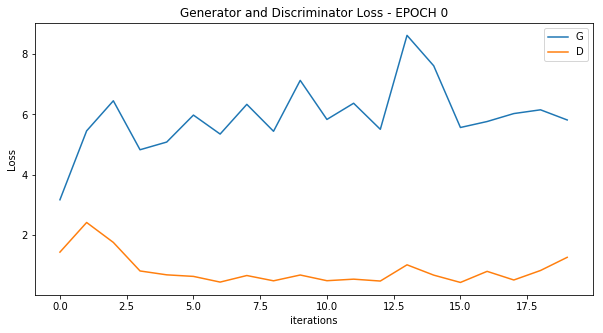

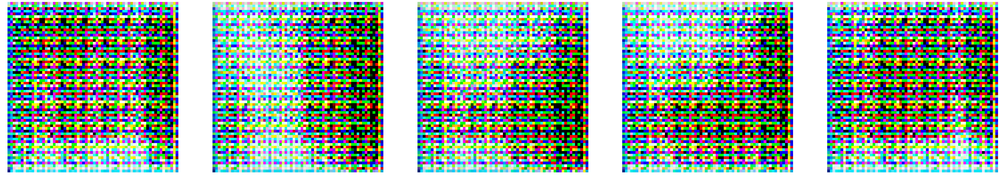

[2/1000][10/20] Loss_D: 0.9877 Loss_G: 3.1547 D(x): 0.4768 D(G(z)): 0.0382 / 0.0383
[2/1000][20/20] Loss_D: 0.7207 Loss_G: 2.1886 D(x): 0.5526 D(G(z)): 0.0335 / 0.1206



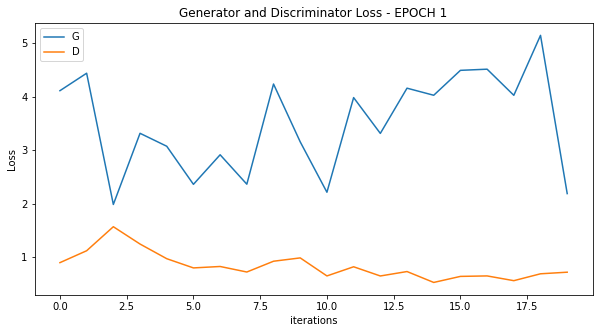

[3/1000][10/20] Loss_D: 0.6842 Loss_G: 4.6334 D(x): 0.7707 D(G(z)): 0.2090 / 0.0070
[3/1000][20/20] Loss_D: 0.7946 Loss_G: 3.6262 D(x): 0.5557 D(G(z)): 0.1474 / 0.0229



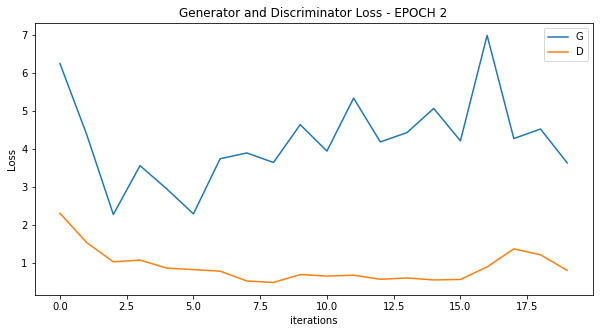

[4/1000][10/20] Loss_D: 1.1545 Loss_G: 2.0782 D(x): 0.5469 D(G(z)): 0.2983 / 0.1071
[4/1000][20/20] Loss_D: 1.0719 Loss_G: 1.9460 D(x): 0.7464 D(G(z)): 0.4145 / 0.1280



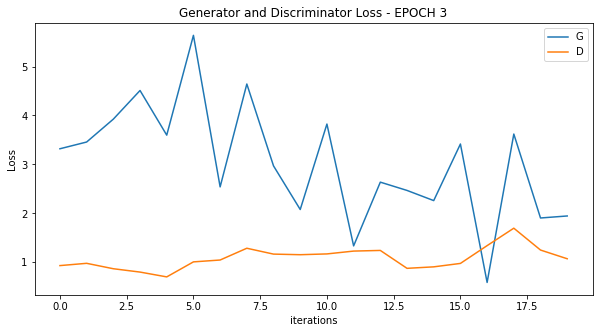

[5/1000][10/20] Loss_D: 1.1142 Loss_G: 1.5165 D(x): 0.4693 D(G(z)): 0.1791 / 0.2246
[5/1000][20/20] Loss_D: 1.2238 Loss_G: 1.2310 D(x): 0.3953 D(G(z)): 0.1910 / 0.3328



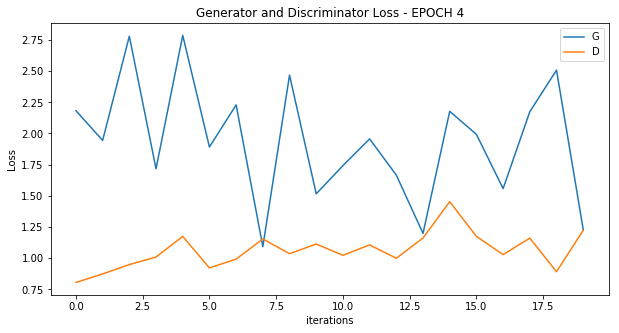

[6/1000][10/20] Loss_D: 1.3618 Loss_G: 1.4103 D(x): 0.4533 D(G(z)): 0.2742 / 0.2413
[6/1000][20/20] Loss_D: 1.0820 Loss_G: 1.8859 D(x): 0.6557 D(G(z)): 0.3608 / 0.1576



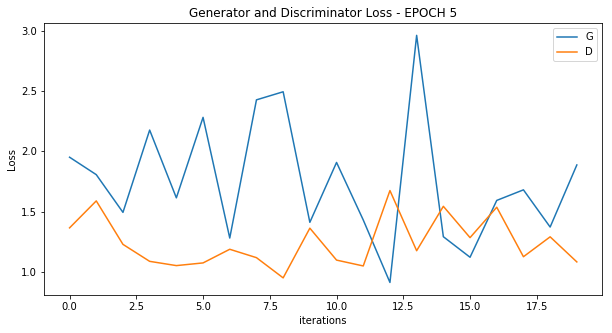

[7/1000][10/20] Loss_D: 1.1834 Loss_G: 1.6135 D(x): 0.5231 D(G(z)): 0.3450 / 0.1948
[7/1000][20/20] Loss_D: 1.2869 Loss_G: 1.1257 D(x): 0.3839 D(G(z)): 0.2706 / 0.3159



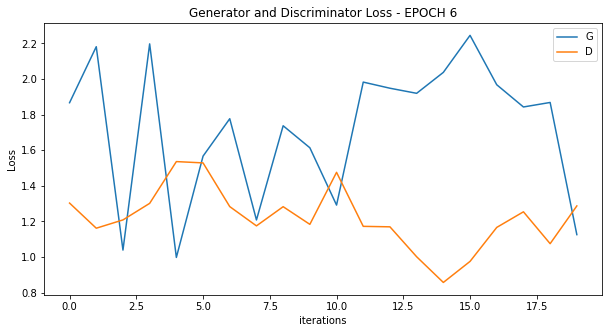

[8/1000][10/20] Loss_D: 1.5969 Loss_G: 2.0743 D(x): 0.7161 D(G(z)): 0.6275 / 0.1354
[8/1000][20/20] Loss_D: 1.4010 Loss_G: 1.1690 D(x): 0.4341 D(G(z)): 0.4072 / 0.2998



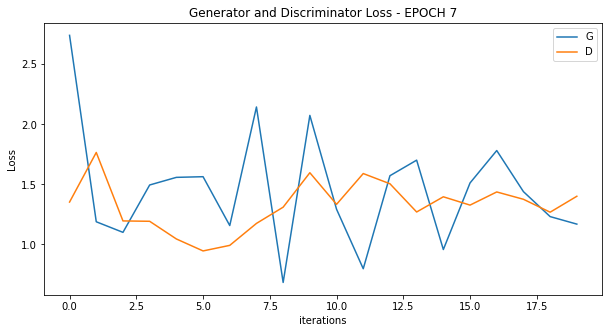

[9/1000][10/20] Loss_D: 1.6437 Loss_G: 1.6059 D(x): 0.3924 D(G(z)): 0.4684 / 0.1915
[9/1000][20/20] Loss_D: 1.7134 Loss_G: 1.2338 D(x): 0.3503 D(G(z)): 0.4598 / 0.2807



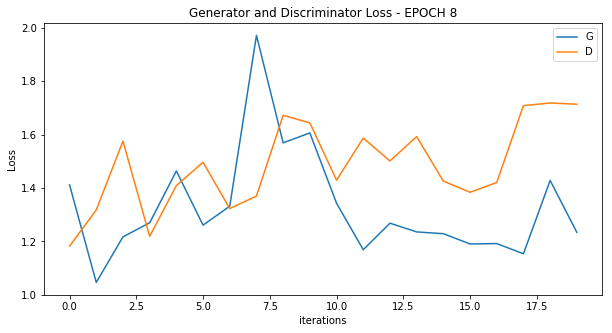

[10/1000][10/20] Loss_D: 1.3659 Loss_G: 1.1045 D(x): 0.4624 D(G(z)): 0.4222 / 0.3162
[10/1000][20/20] Loss_D: 1.3569 Loss_G: 1.0066 D(x): 0.4480 D(G(z)): 0.4151 / 0.3481



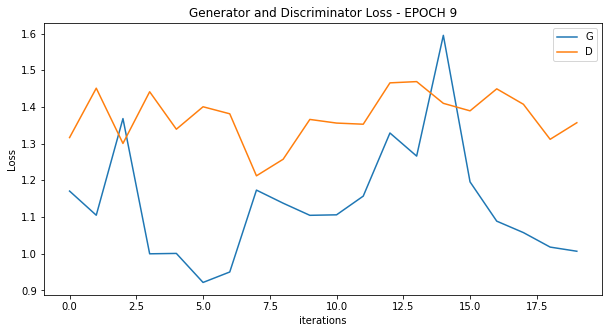

[11/1000][10/20] Loss_D: 1.3469 Loss_G: 1.3387 D(x): 0.4957 D(G(z)): 0.4154 / 0.2618
[11/1000][20/20] Loss_D: 1.3765 Loss_G: 1.2213 D(x): 0.4143 D(G(z)): 0.3536 / 0.2806



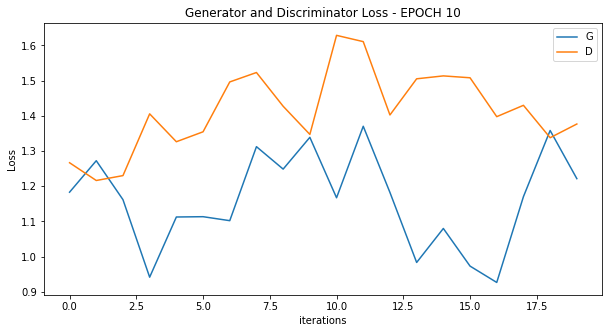

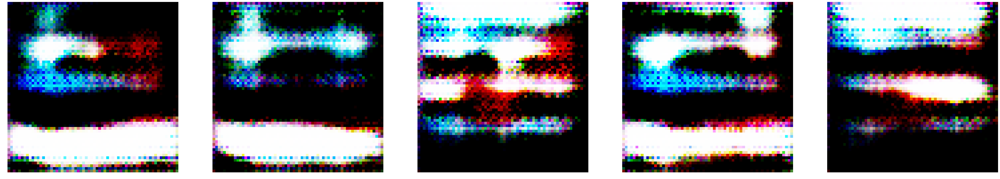

[12/1000][10/20] Loss_D: 1.1568 Loss_G: 1.2575 D(x): 0.5167 D(G(z)): 0.3658 / 0.2698
[12/1000][20/20] Loss_D: 1.3732 Loss_G: 1.1025 D(x): 0.4872 D(G(z)): 0.4571 / 0.3158



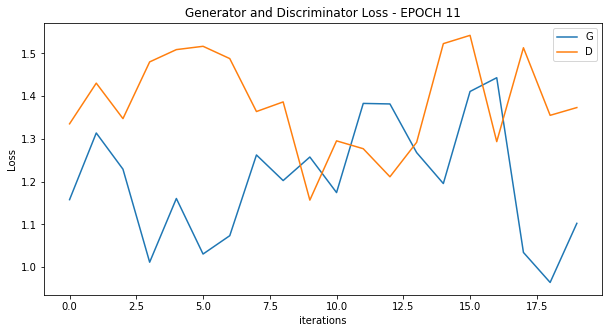

[13/1000][10/20] Loss_D: 1.2086 Loss_G: 1.1575 D(x): 0.5231 D(G(z)): 0.3921 / 0.3045
[13/1000][20/20] Loss_D: 1.4583 Loss_G: 1.0513 D(x): 0.4336 D(G(z)): 0.4434 / 0.3328



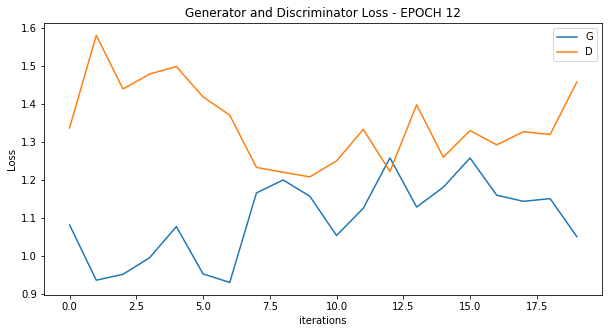

[14/1000][10/20] Loss_D: 1.3930 Loss_G: 0.9785 D(x): 0.4277 D(G(z)): 0.4034 / 0.3685
[14/1000][20/20] Loss_D: 1.5414 Loss_G: 0.8532 D(x): 0.4017 D(G(z)): 0.4305 / 0.4348



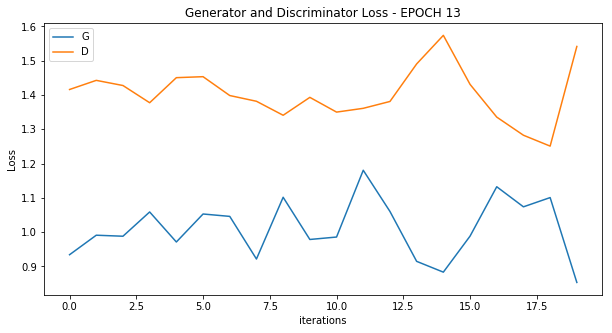

[15/1000][10/20] Loss_D: 1.4902 Loss_G: 1.0864 D(x): 0.4455 D(G(z)): 0.4709 / 0.3341
[15/1000][20/20] Loss_D: 1.4264 Loss_G: 1.2197 D(x): 0.4901 D(G(z)): 0.4957 / 0.2739



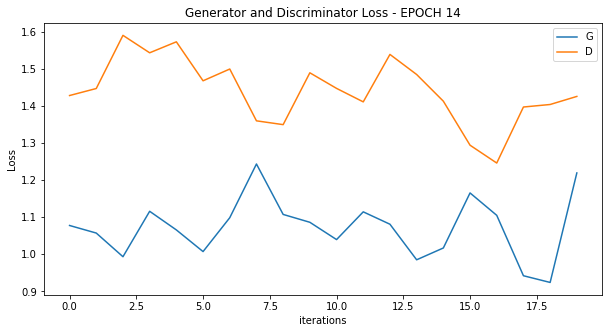

[16/1000][10/20] Loss_D: 1.2767 Loss_G: 1.1973 D(x): 0.4998 D(G(z)): 0.4135 / 0.2990
[16/1000][20/20] Loss_D: 1.5557 Loss_G: 0.9466 D(x): 0.3246 D(G(z)): 0.3436 / 0.3706



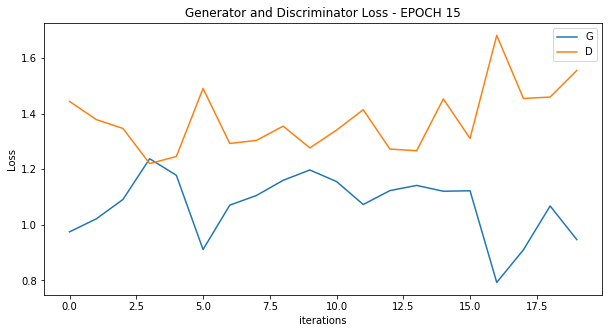

[17/1000][10/20] Loss_D: 1.3687 Loss_G: 1.0185 D(x): 0.4645 D(G(z)): 0.4238 / 0.3518
[17/1000][20/20] Loss_D: 1.5848 Loss_G: 0.9351 D(x): 0.3794 D(G(z)): 0.4646 / 0.3791



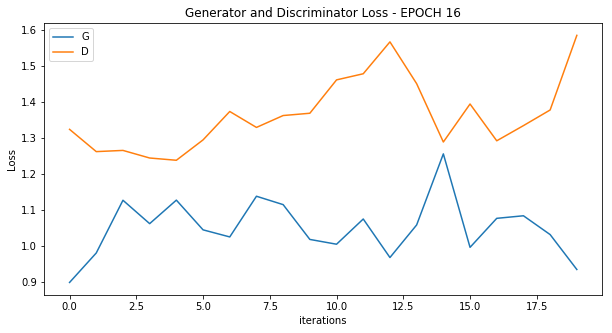

[18/1000][10/20] Loss_D: 1.3312 Loss_G: 1.1515 D(x): 0.5094 D(G(z)): 0.4333 / 0.3077
[18/1000][20/20] Loss_D: 1.2511 Loss_G: 1.0753 D(x): 0.5203 D(G(z)): 0.4333 / 0.3244



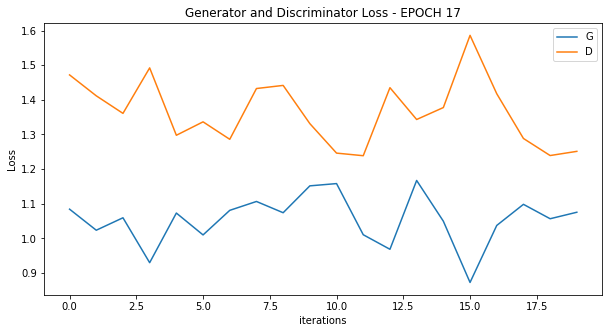

[19/1000][10/20] Loss_D: 1.2656 Loss_G: 1.0537 D(x): 0.5059 D(G(z)): 0.4151 / 0.3306
[19/1000][20/20] Loss_D: 1.3468 Loss_G: 0.9668 D(x): 0.4362 D(G(z)): 0.3888 / 0.3932



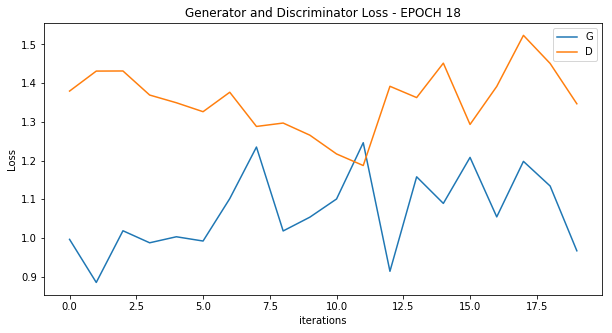

[20/1000][10/20] Loss_D: 1.2797 Loss_G: 1.1057 D(x): 0.4949 D(G(z)): 0.4208 / 0.3154
[20/1000][20/20] Loss_D: 1.3939 Loss_G: 1.1473 D(x): 0.3724 D(G(z)): 0.3322 / 0.3003



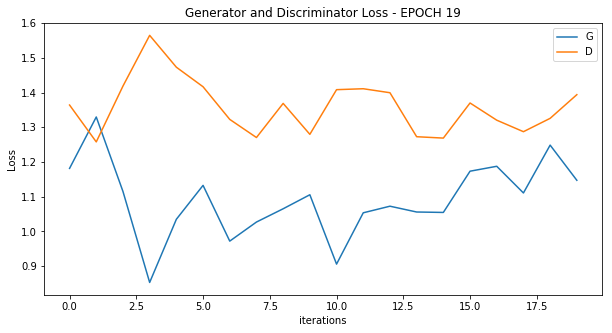

[21/1000][10/20] Loss_D: 1.2755 Loss_G: 1.1677 D(x): 0.5394 D(G(z)): 0.4562 / 0.2995
[21/1000][20/20] Loss_D: 1.3397 Loss_G: 1.3499 D(x): 0.5111 D(G(z)): 0.4632 / 0.2432



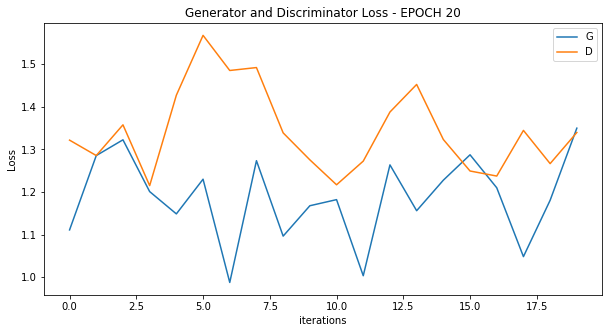

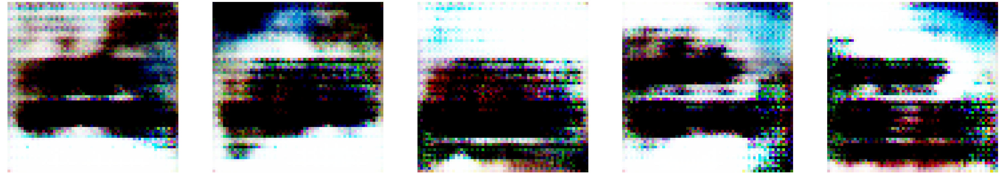

[22/1000][10/20] Loss_D: 1.2911 Loss_G: 1.3564 D(x): 0.5168 D(G(z)): 0.4362 / 0.2420
[22/1000][20/20] Loss_D: 1.2838 Loss_G: 1.3478 D(x): 0.4619 D(G(z)): 0.3534 / 0.2529



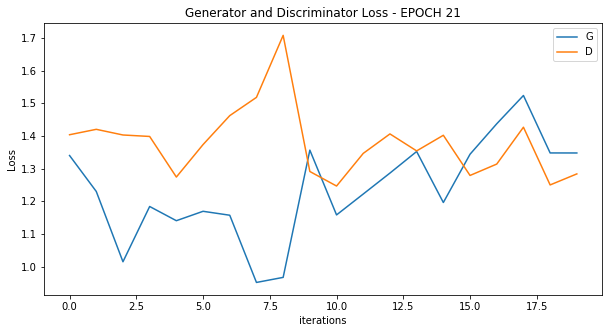

[23/1000][10/20] Loss_D: 1.4175 Loss_G: 1.2327 D(x): 0.4679 D(G(z)): 0.4601 / 0.2717
[23/1000][20/20] Loss_D: 1.6862 Loss_G: 0.8726 D(x): 0.3284 D(G(z)): 0.4144 / 0.4169



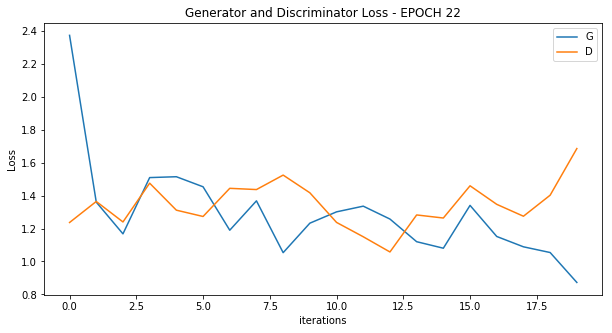

[24/1000][10/20] Loss_D: 1.1893 Loss_G: 1.2796 D(x): 0.5752 D(G(z)): 0.4325 / 0.2692
[24/1000][20/20] Loss_D: 1.5980 Loss_G: 1.3480 D(x): 0.4276 D(G(z)): 0.4971 / 0.2546



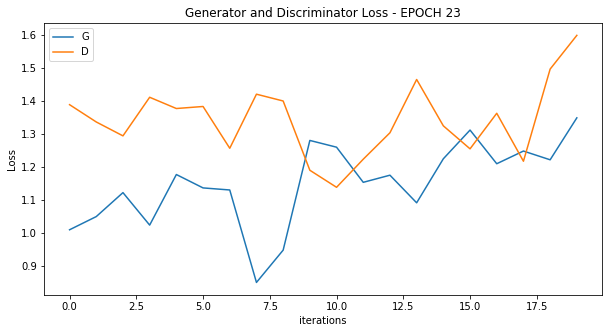

[25/1000][10/20] Loss_D: 1.3511 Loss_G: 1.1258 D(x): 0.4097 D(G(z)): 0.3559 / 0.3062
[25/1000][20/20] Loss_D: 1.6924 Loss_G: 0.7783 D(x): 0.3987 D(G(z)): 0.5277 / 0.4572



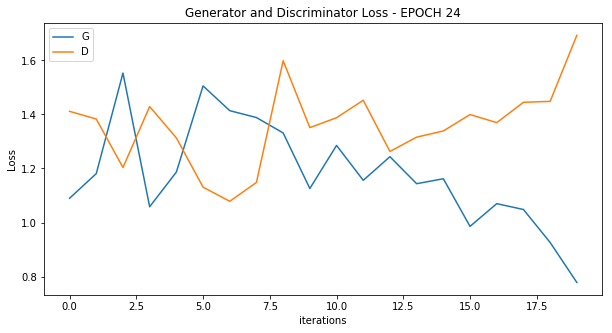

[26/1000][10/20] Loss_D: 1.2986 Loss_G: 1.4402 D(x): 0.5456 D(G(z)): 0.4729 / 0.2234
[26/1000][20/20] Loss_D: 1.3652 Loss_G: 1.6243 D(x): 0.4544 D(G(z)): 0.4065 / 0.1756



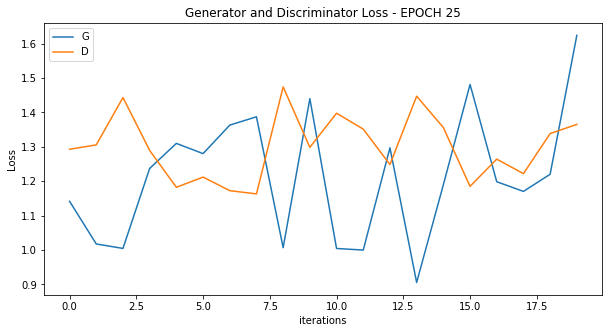

[27/1000][10/20] Loss_D: 1.3299 Loss_G: 1.2981 D(x): 0.4720 D(G(z)): 0.4193 / 0.2597
[27/1000][20/20] Loss_D: 1.3029 Loss_G: 1.4786 D(x): 0.5556 D(G(z)): 0.4550 / 0.2165



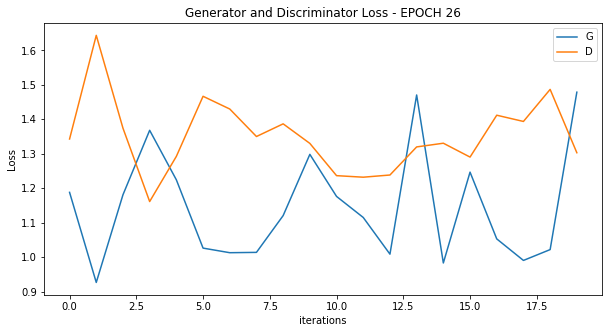

[28/1000][10/20] Loss_D: 1.3333 Loss_G: 1.2759 D(x): 0.4517 D(G(z)): 0.3823 / 0.2677
[28/1000][20/20] Loss_D: 1.7230 Loss_G: 1.3654 D(x): 0.4230 D(G(z)): 0.5415 / 0.2352



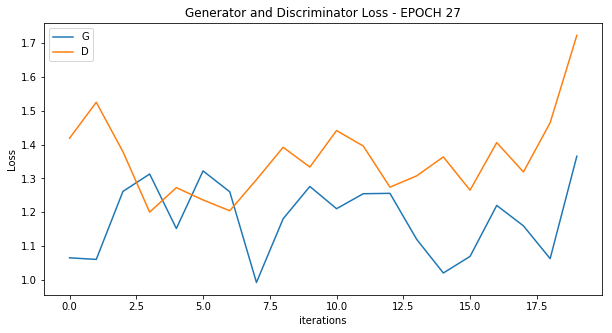

[29/1000][10/20] Loss_D: 1.3964 Loss_G: 1.0827 D(x): 0.4636 D(G(z)): 0.4410 / 0.3216
[29/1000][20/20] Loss_D: 1.2648 Loss_G: 1.2535 D(x): 0.5088 D(G(z)): 0.4185 / 0.2691



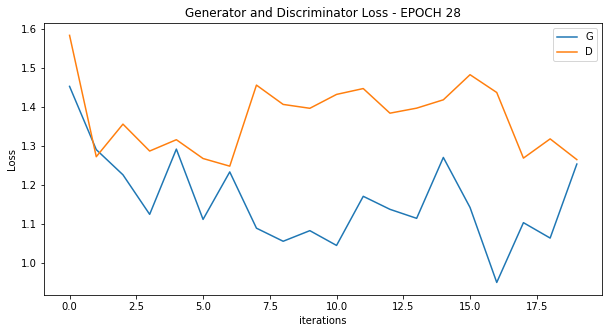

[30/1000][10/20] Loss_D: 1.2917 Loss_G: 1.1860 D(x): 0.5259 D(G(z)): 0.4473 / 0.2919
[30/1000][20/20] Loss_D: 1.3702 Loss_G: 1.0475 D(x): 0.4655 D(G(z)): 0.4443 / 0.3397



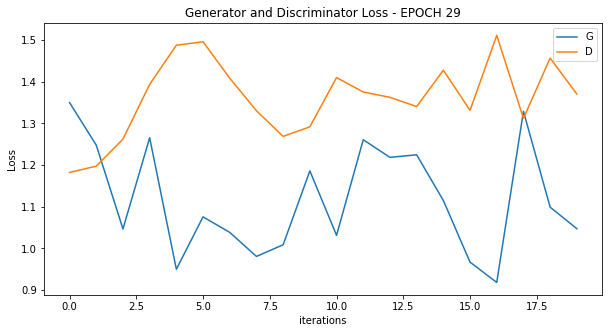

[31/1000][10/20] Loss_D: 1.3788 Loss_G: 1.2677 D(x): 0.5134 D(G(z)): 0.4749 / 0.2752
[31/1000][20/20] Loss_D: 1.1923 Loss_G: 1.4559 D(x): 0.5116 D(G(z)): 0.3775 / 0.2145



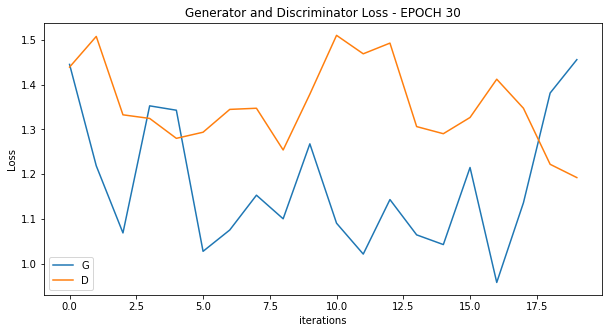

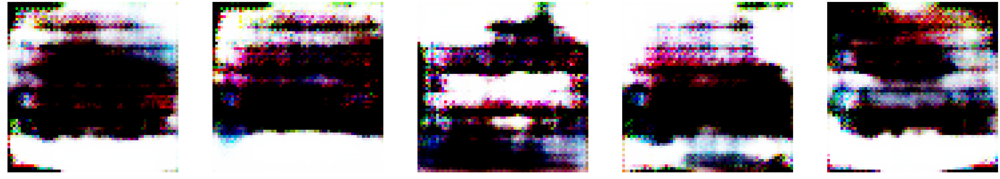

[32/1000][10/20] Loss_D: 1.3606 Loss_G: 1.2147 D(x): 0.4802 D(G(z)): 0.4301 / 0.2917
[32/1000][20/20] Loss_D: 1.3157 Loss_G: 1.1949 D(x): 0.4705 D(G(z)): 0.4179 / 0.2856



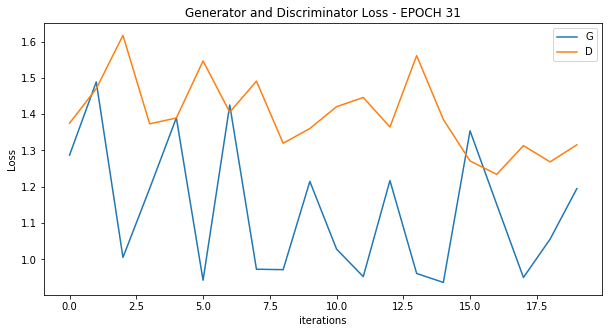

[33/1000][10/20] Loss_D: 1.4570 Loss_G: 1.0622 D(x): 0.4197 D(G(z)): 0.4252 / 0.3412
[33/1000][20/20] Loss_D: 1.4438 Loss_G: 1.0849 D(x): 0.4218 D(G(z)): 0.4279 / 0.3268



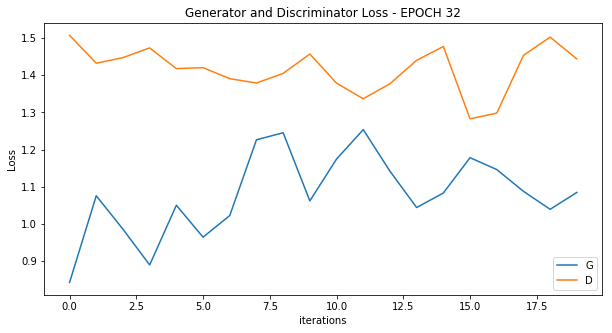

[34/1000][10/20] Loss_D: 1.5044 Loss_G: 1.1447 D(x): 0.3972 D(G(z)): 0.4324 / 0.3077
[34/1000][20/20] Loss_D: 1.3242 Loss_G: 1.0427 D(x): 0.4870 D(G(z)): 0.4075 / 0.3460



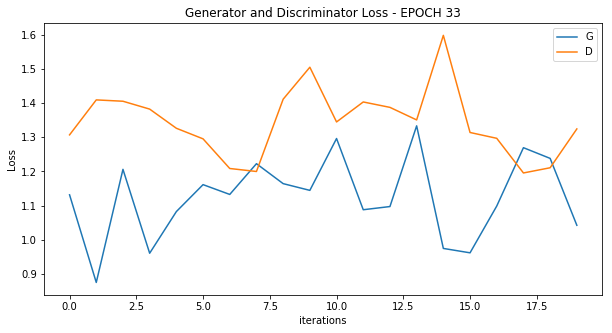

[35/1000][10/20] Loss_D: 1.3853 Loss_G: 0.8752 D(x): 0.4335 D(G(z)): 0.4154 / 0.4097
[35/1000][20/20] Loss_D: 1.3804 Loss_G: 0.9730 D(x): 0.4085 D(G(z)): 0.3761 / 0.3713



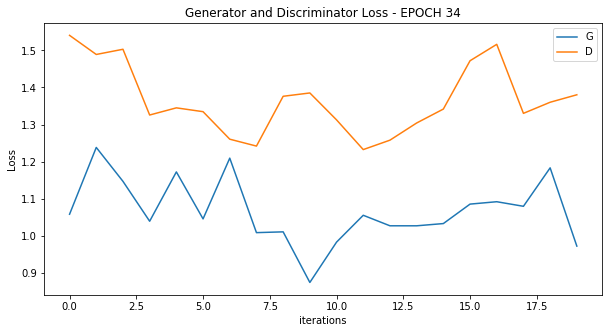

[36/1000][10/20] Loss_D: 1.5730 Loss_G: 0.9313 D(x): 0.4323 D(G(z)): 0.5004 / 0.3851
[36/1000][20/20] Loss_D: 1.3342 Loss_G: 1.4364 D(x): 0.4755 D(G(z)): 0.4224 / 0.2208



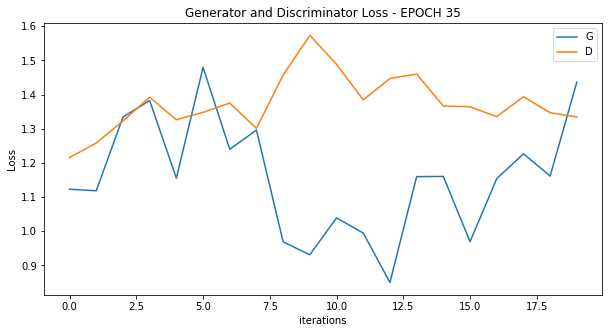

[37/1000][10/20] Loss_D: 1.3231 Loss_G: 1.0993 D(x): 0.4480 D(G(z)): 0.3883 / 0.3170
[37/1000][20/20] Loss_D: 1.4739 Loss_G: 1.4103 D(x): 0.5058 D(G(z)): 0.5149 / 0.2313



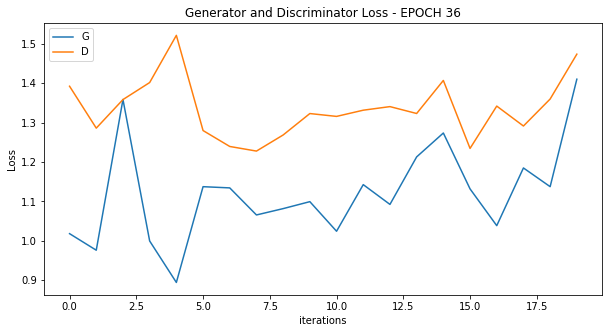

[38/1000][10/20] Loss_D: 1.2287 Loss_G: 1.0947 D(x): 0.4823 D(G(z)): 0.3760 / 0.3155
[38/1000][20/20] Loss_D: 1.3494 Loss_G: 1.4686 D(x): 0.4641 D(G(z)): 0.4090 / 0.2089



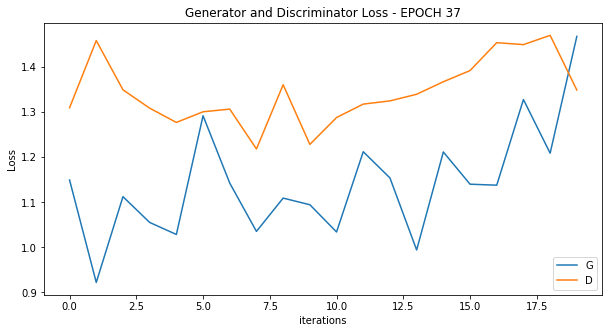

[39/1000][10/20] Loss_D: 1.3941 Loss_G: 1.2178 D(x): 0.5094 D(G(z)): 0.4895 / 0.2731
[39/1000][20/20] Loss_D: 1.3289 Loss_G: 1.1084 D(x): 0.4865 D(G(z)): 0.4278 / 0.3190



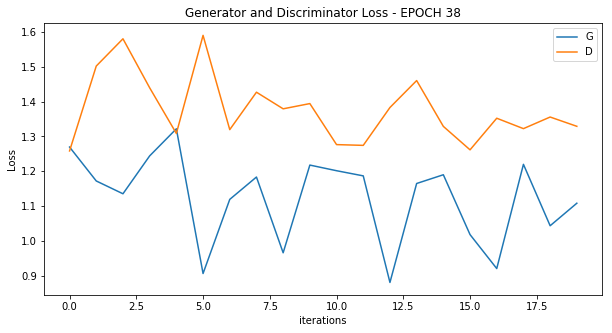

[40/1000][10/20] Loss_D: 1.2343 Loss_G: 1.0354 D(x): 0.4677 D(G(z)): 0.3636 / 0.3441
[40/1000][20/20] Loss_D: 1.3560 Loss_G: 1.1743 D(x): 0.4619 D(G(z)): 0.4320 / 0.2901



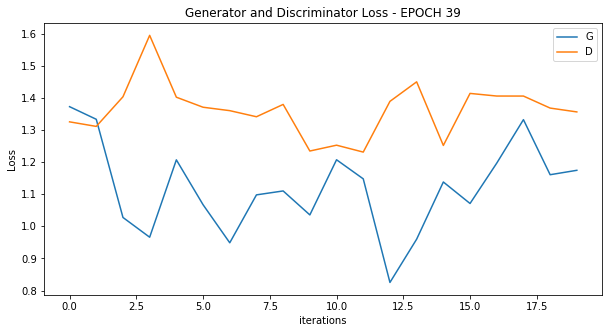

[41/1000][10/20] Loss_D: 1.3783 Loss_G: 1.0137 D(x): 0.4951 D(G(z)): 0.4730 / 0.3508
[41/1000][20/20] Loss_D: 1.4082 Loss_G: 1.0373 D(x): 0.4681 D(G(z)): 0.4343 / 0.3457



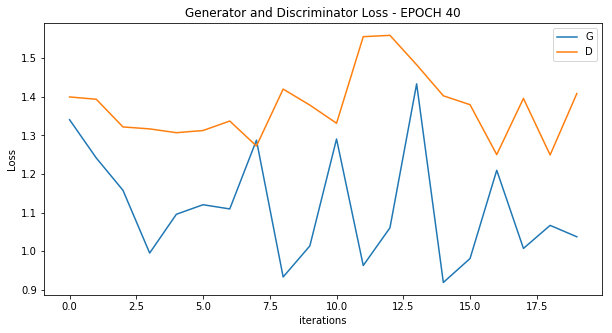

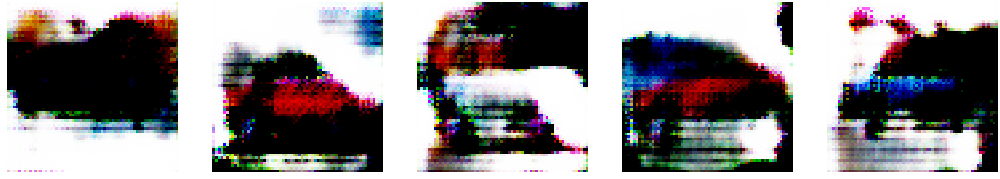

[42/1000][10/20] Loss_D: 1.3818 Loss_G: 1.2505 D(x): 0.4798 D(G(z)): 0.4331 / 0.2757
[42/1000][20/20] Loss_D: 1.1774 Loss_G: 1.4748 D(x): 0.5184 D(G(z)): 0.3591 / 0.2207



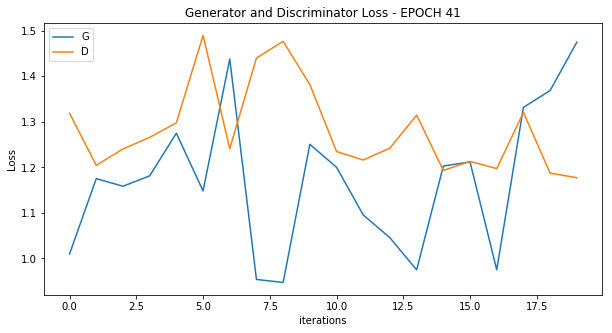

[43/1000][10/20] Loss_D: 1.3034 Loss_G: 1.2237 D(x): 0.4679 D(G(z)): 0.4026 / 0.2877
[43/1000][20/20] Loss_D: 1.4316 Loss_G: 1.1354 D(x): 0.4818 D(G(z)): 0.4794 / 0.3027



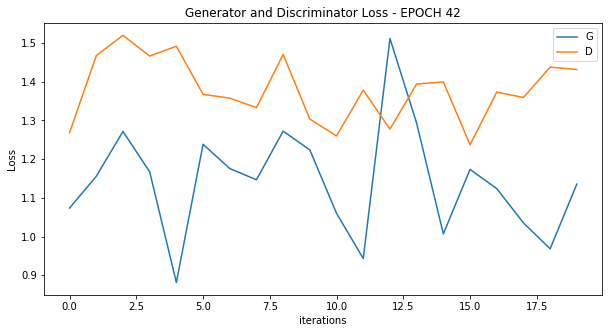

[44/1000][10/20] Loss_D: 1.3178 Loss_G: 1.0084 D(x): 0.4525 D(G(z)): 0.3989 / 0.3512
[44/1000][20/20] Loss_D: 1.2882 Loss_G: 1.4750 D(x): 0.4687 D(G(z)): 0.3867 / 0.2061



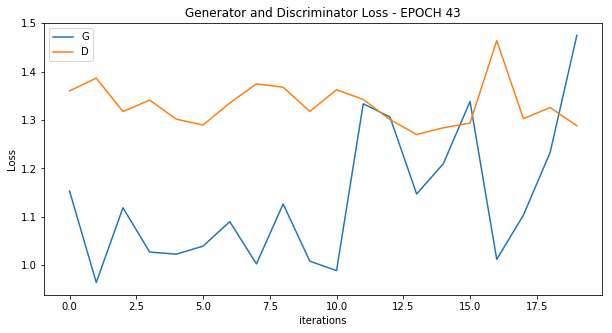

[45/1000][10/20] Loss_D: 1.2860 Loss_G: 1.1005 D(x): 0.4913 D(G(z)): 0.4159 / 0.3200
[45/1000][20/20] Loss_D: 1.3312 Loss_G: 1.1716 D(x): 0.4898 D(G(z)): 0.4331 / 0.3006



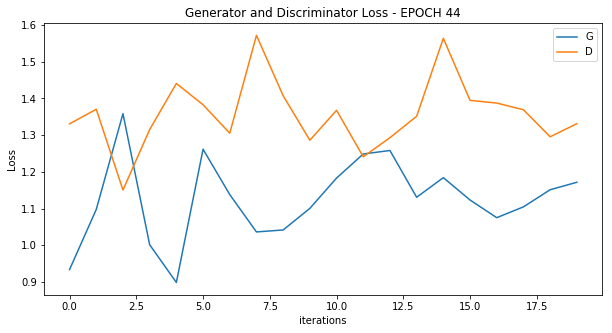

[46/1000][10/20] Loss_D: 1.3204 Loss_G: 1.0603 D(x): 0.5133 D(G(z)): 0.4593 / 0.3323
[46/1000][20/20] Loss_D: 1.2558 Loss_G: 1.2615 D(x): 0.3962 D(G(z)): 0.2906 / 0.2797



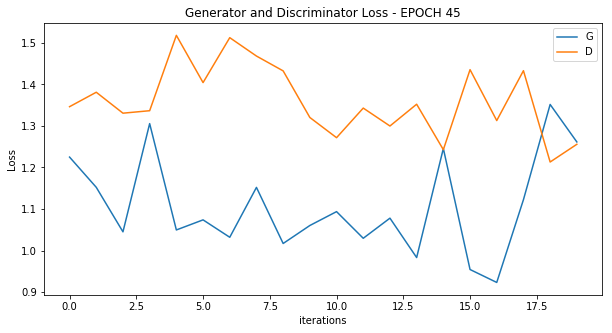

[47/1000][10/20] Loss_D: 1.3463 Loss_G: 1.1007 D(x): 0.5509 D(G(z)): 0.4800 / 0.3224
[47/1000][20/20] Loss_D: 1.2046 Loss_G: 1.5695 D(x): 0.4960 D(G(z)): 0.3637 / 0.1962



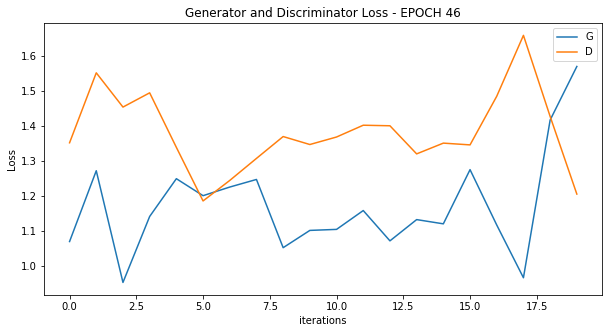

[48/1000][10/20] Loss_D: 1.2837 Loss_G: 1.2411 D(x): 0.5585 D(G(z)): 0.4687 / 0.2843
[48/1000][20/20] Loss_D: 1.2493 Loss_G: 1.2454 D(x): 0.5113 D(G(z)): 0.4086 / 0.2709



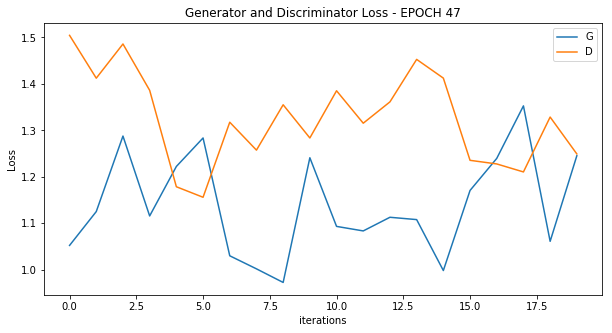

[49/1000][10/20] Loss_D: 1.3365 Loss_G: 1.1619 D(x): 0.4666 D(G(z)): 0.4175 / 0.2960
[49/1000][20/20] Loss_D: 1.2876 Loss_G: 1.1770 D(x): 0.4352 D(G(z)): 0.3494 / 0.2924



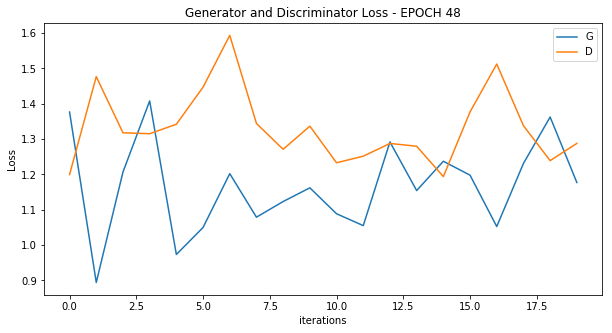

[50/1000][10/20] Loss_D: 1.5522 Loss_G: 1.1832 D(x): 0.5076 D(G(z)): 0.5459 / 0.3047
[50/1000][20/20] Loss_D: 1.6234 Loss_G: 1.1265 D(x): 0.3254 D(G(z)): 0.4002 / 0.3027



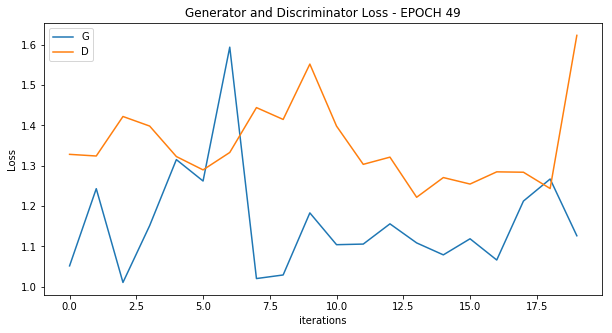

[51/1000][10/20] Loss_D: 1.3321 Loss_G: 1.1705 D(x): 0.5522 D(G(z)): 0.4840 / 0.2958
[51/1000][20/20] Loss_D: 1.3093 Loss_G: 1.0523 D(x): 0.4412 D(G(z)): 0.3759 / 0.3311



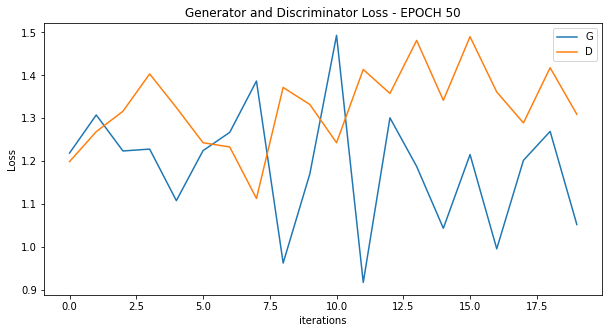

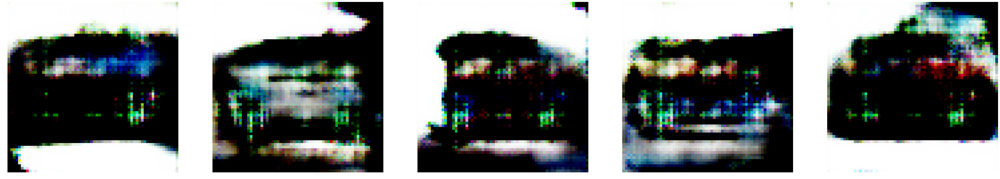

[52/1000][10/20] Loss_D: 1.1327 Loss_G: 1.2213 D(x): 0.5796 D(G(z)): 0.4127 / 0.2788
[52/1000][20/20] Loss_D: 1.4265 Loss_G: 1.4311 D(x): 0.5568 D(G(z)): 0.4984 / 0.2450



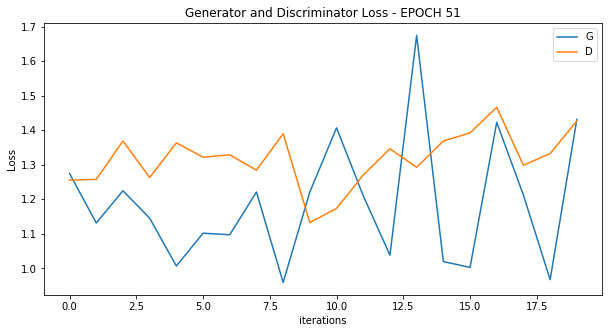

[53/1000][10/20] Loss_D: 1.3159 Loss_G: 1.3200 D(x): 0.5909 D(G(z)): 0.4954 / 0.2580
[53/1000][20/20] Loss_D: 1.2827 Loss_G: 1.6564 D(x): 0.5312 D(G(z)): 0.4322 / 0.1721



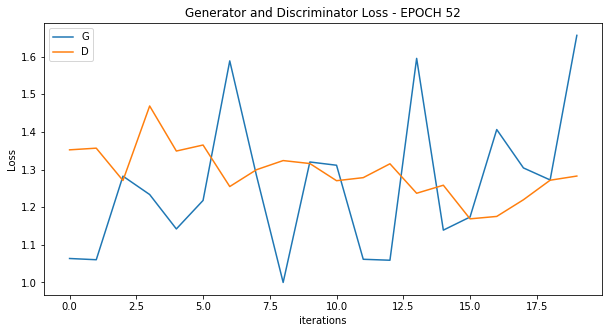

[54/1000][10/20] Loss_D: 1.3925 Loss_G: 1.2641 D(x): 0.5437 D(G(z)): 0.4965 / 0.2705
[54/1000][20/20] Loss_D: 1.3511 Loss_G: 1.5199 D(x): 0.5172 D(G(z)): 0.4606 / 0.2026



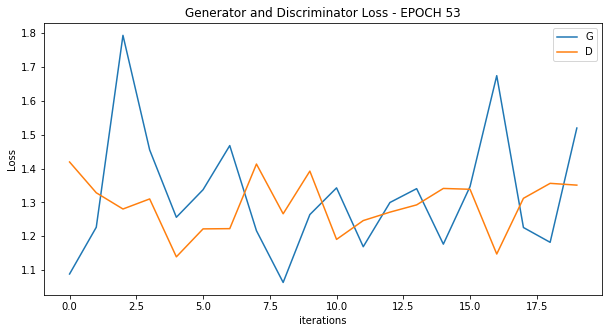

[55/1000][10/20] Loss_D: 1.2386 Loss_G: 1.2190 D(x): 0.5302 D(G(z)): 0.4205 / 0.2824
[55/1000][20/20] Loss_D: 1.5413 Loss_G: 1.2292 D(x): 0.4823 D(G(z)): 0.5028 / 0.2859



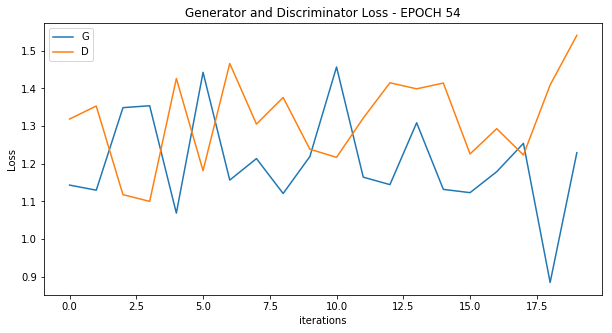

[56/1000][10/20] Loss_D: 1.3488 Loss_G: 1.0680 D(x): 0.4908 D(G(z)): 0.4278 / 0.3408
[56/1000][20/20] Loss_D: 1.1501 Loss_G: 1.4221 D(x): 0.5265 D(G(z)): 0.3614 / 0.2256



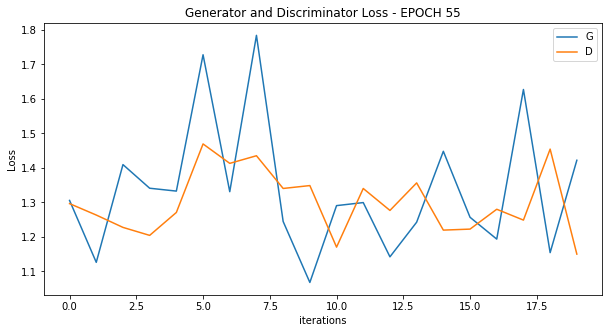

[57/1000][10/20] Loss_D: 1.5008 Loss_G: 0.9706 D(x): 0.3761 D(G(z)): 0.3734 / 0.3689
[57/1000][20/20] Loss_D: 1.6032 Loss_G: 1.3067 D(x): 0.4079 D(G(z)): 0.4765 / 0.2529



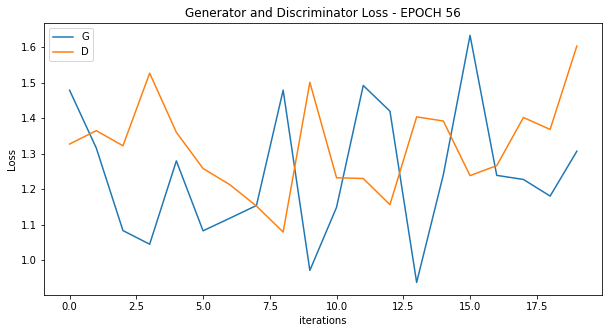

[58/1000][10/20] Loss_D: 1.3981 Loss_G: 1.4813 D(x): 0.4565 D(G(z)): 0.4236 / 0.2165
[58/1000][20/20] Loss_D: 1.3340 Loss_G: 1.3898 D(x): 0.4985 D(G(z)): 0.4277 / 0.2335



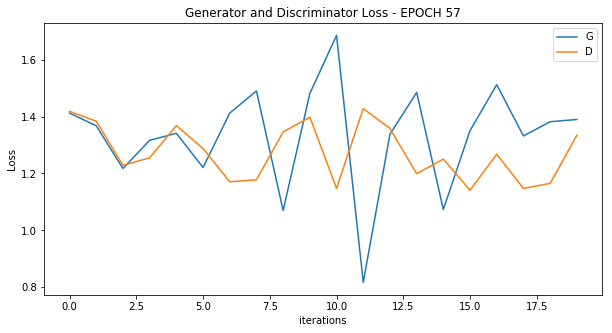

[59/1000][10/20] Loss_D: 1.3068 Loss_G: 1.2699 D(x): 0.5721 D(G(z)): 0.4722 / 0.2679
[59/1000][20/20] Loss_D: 1.3505 Loss_G: 1.3750 D(x): 0.4368 D(G(z)): 0.3625 / 0.2409



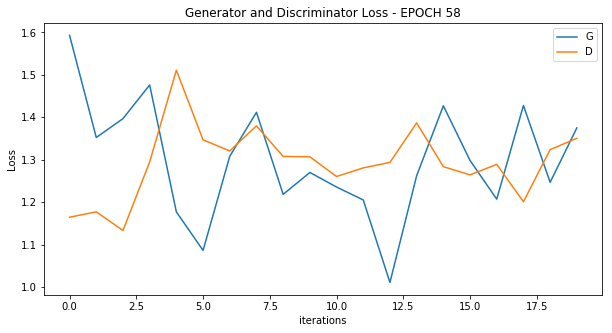

[60/1000][10/20] Loss_D: 1.2451 Loss_G: 1.4147 D(x): 0.4494 D(G(z)): 0.3356 / 0.2346
[60/1000][20/20] Loss_D: 1.2858 Loss_G: 1.2968 D(x): 0.4978 D(G(z)): 0.4196 / 0.2544



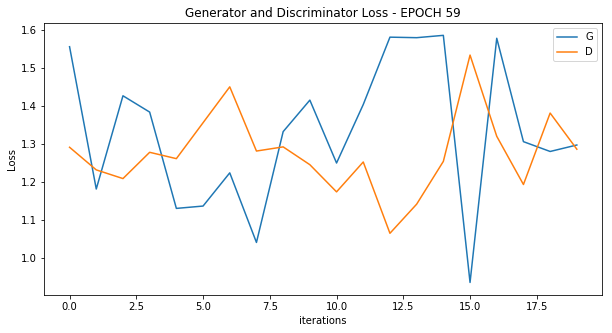

[61/1000][10/20] Loss_D: 1.2194 Loss_G: 1.2920 D(x): 0.4169 D(G(z)): 0.2838 / 0.2582
[61/1000][20/20] Loss_D: 1.2098 Loss_G: 1.5503 D(x): 0.5397 D(G(z)): 0.3811 / 0.1994



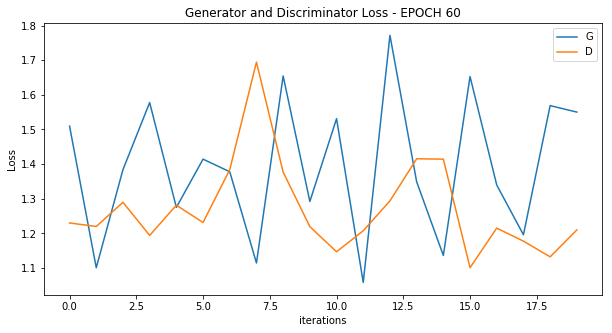

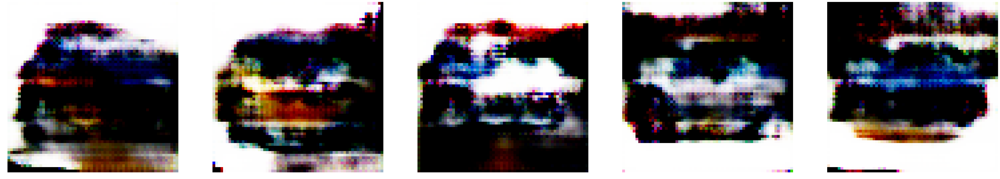

[62/1000][10/20] Loss_D: 1.2571 Loss_G: 1.1805 D(x): 0.4241 D(G(z)): 0.3109 / 0.2905
[62/1000][20/20] Loss_D: 1.3076 Loss_G: 1.3199 D(x): 0.4925 D(G(z)): 0.3937 / 0.2514



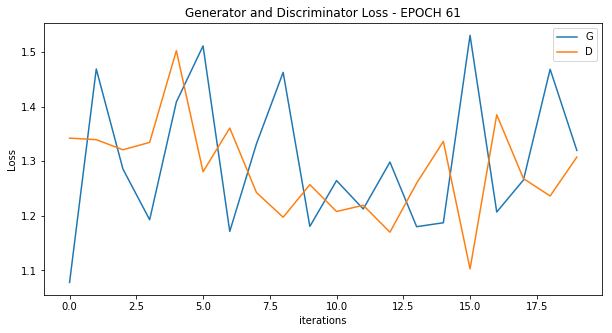

[63/1000][10/20] Loss_D: 1.2671 Loss_G: 1.1541 D(x): 0.5123 D(G(z)): 0.4082 / 0.3044
[63/1000][20/20] Loss_D: 1.3891 Loss_G: 1.1927 D(x): 0.4009 D(G(z)): 0.3611 / 0.2826



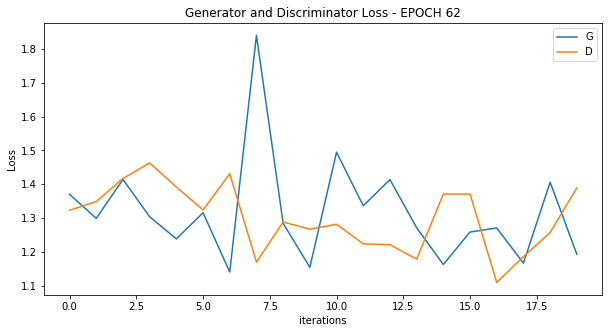

[64/1000][10/20] Loss_D: 1.3379 Loss_G: 1.1632 D(x): 0.4305 D(G(z)): 0.3329 / 0.3067
[64/1000][20/20] Loss_D: 1.3639 Loss_G: 1.4119 D(x): 0.4515 D(G(z)): 0.3960 / 0.2269



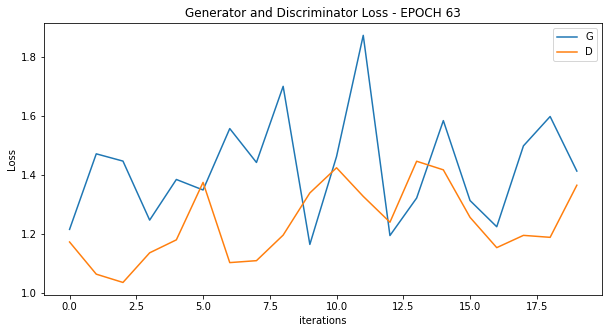

[65/1000][10/20] Loss_D: 1.2342 Loss_G: 1.4011 D(x): 0.5373 D(G(z)): 0.3990 / 0.2417
[65/1000][20/20] Loss_D: 1.3742 Loss_G: 1.1856 D(x): 0.3837 D(G(z)): 0.3205 / 0.2905



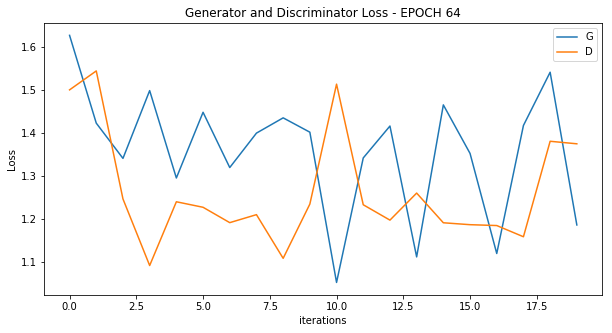

[66/1000][10/20] Loss_D: 1.2643 Loss_G: 1.5948 D(x): 0.6039 D(G(z)): 0.4678 / 0.1951
[66/1000][20/20] Loss_D: 1.1075 Loss_G: 1.6784 D(x): 0.6655 D(G(z)): 0.4297 / 0.1902



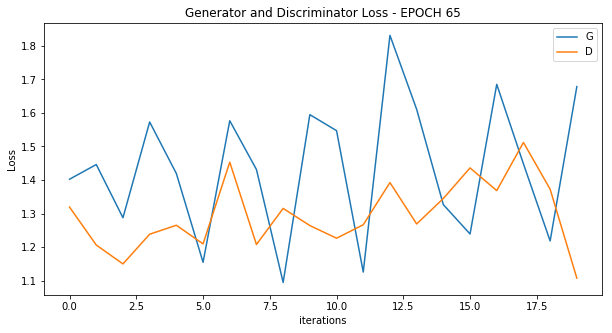

[67/1000][10/20] Loss_D: 1.3148 Loss_G: 1.9309 D(x): 0.5149 D(G(z)): 0.4349 / 0.1372
[67/1000][20/20] Loss_D: 1.2858 Loss_G: 1.4049 D(x): 0.5761 D(G(z)): 0.4736 / 0.2341



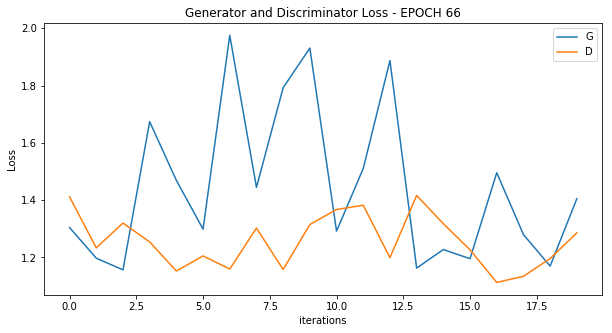

[68/1000][10/20] Loss_D: 1.1695 Loss_G: 1.2999 D(x): 0.5658 D(G(z)): 0.4151 / 0.2541
[68/1000][20/20] Loss_D: 1.3272 Loss_G: 1.4391 D(x): 0.4245 D(G(z)): 0.3318 / 0.2240



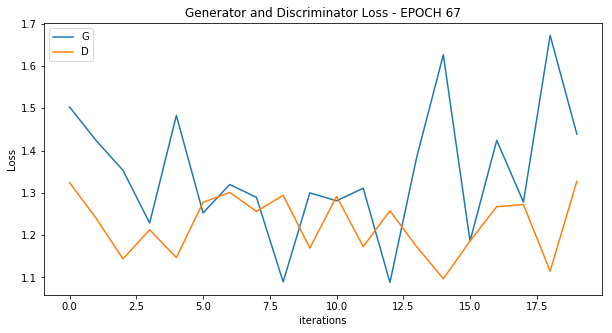

[69/1000][10/20] Loss_D: 1.3339 Loss_G: 1.2541 D(x): 0.4941 D(G(z)): 0.4364 / 0.2767
[69/1000][20/20] Loss_D: 1.4236 Loss_G: 1.2117 D(x): 0.4144 D(G(z)): 0.3940 / 0.2829



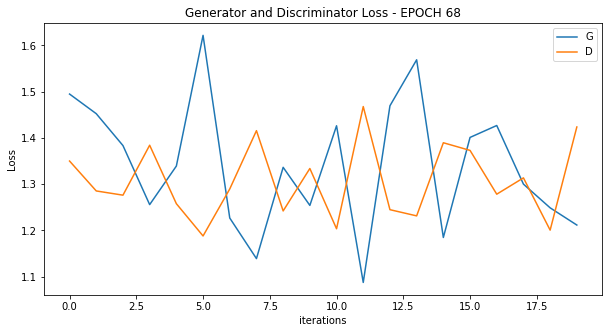

[70/1000][10/20] Loss_D: 1.2402 Loss_G: 1.3996 D(x): 0.4317 D(G(z)): 0.3017 / 0.2300
[70/1000][20/20] Loss_D: 0.9780 Loss_G: 1.8882 D(x): 0.6024 D(G(z)): 0.3281 / 0.1327



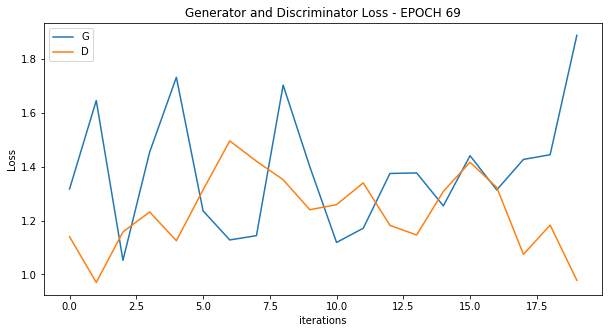

[71/1000][10/20] Loss_D: 1.3778 Loss_G: 1.1891 D(x): 0.4031 D(G(z)): 0.3369 / 0.2946
[71/1000][20/20] Loss_D: 1.3050 Loss_G: 1.6917 D(x): 0.5067 D(G(z)): 0.4102 / 0.1776



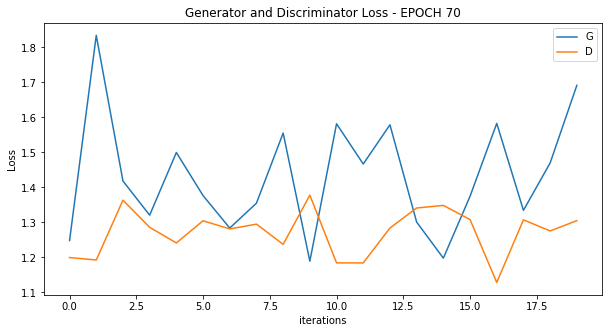

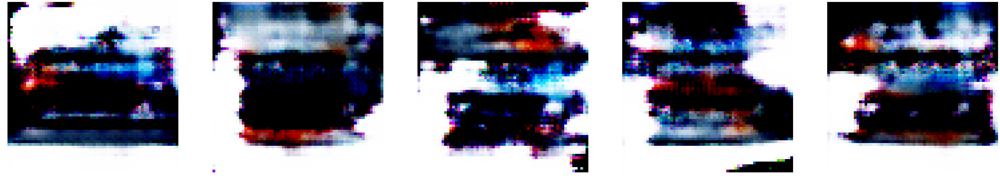

[72/1000][10/20] Loss_D: 1.3055 Loss_G: 1.7823 D(x): 0.4999 D(G(z)): 0.4049 / 0.1660
[72/1000][20/20] Loss_D: 1.3425 Loss_G: 1.7718 D(x): 0.4728 D(G(z)): 0.3834 / 0.1556



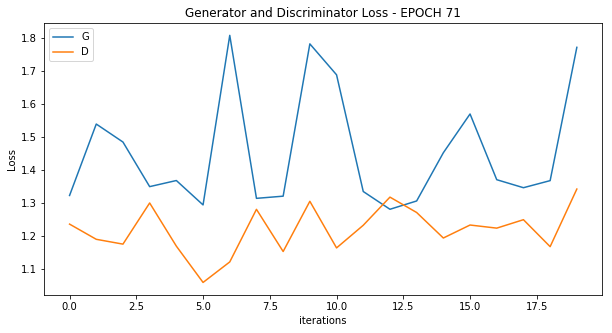

[73/1000][10/20] Loss_D: 1.5305 Loss_G: 1.2032 D(x): 0.3421 D(G(z)): 0.3525 / 0.2924
[73/1000][20/20] Loss_D: 1.2925 Loss_G: 1.7708 D(x): 0.5464 D(G(z)): 0.4574 / 0.1528



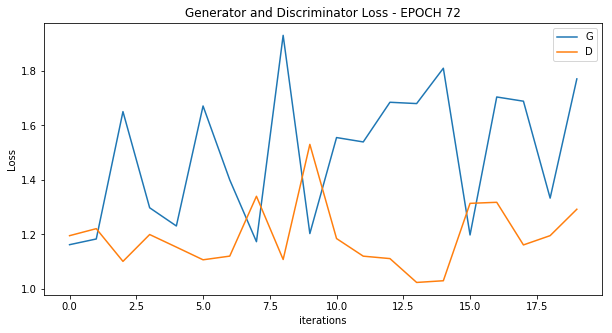

[74/1000][10/20] Loss_D: 1.1881 Loss_G: 1.6935 D(x): 0.7085 D(G(z)): 0.4862 / 0.1831
[74/1000][20/20] Loss_D: 1.1351 Loss_G: 1.9991 D(x): 0.5591 D(G(z)): 0.3835 / 0.1198



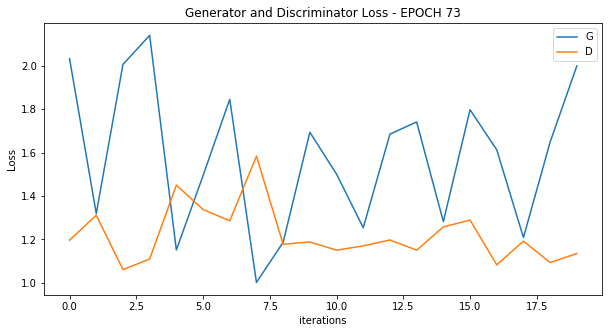

[75/1000][10/20] Loss_D: 1.0654 Loss_G: 1.8665 D(x): 0.5647 D(G(z)): 0.3376 / 0.1471
[75/1000][20/20] Loss_D: 1.0344 Loss_G: 1.7564 D(x): 0.5424 D(G(z)): 0.2875 / 0.1599



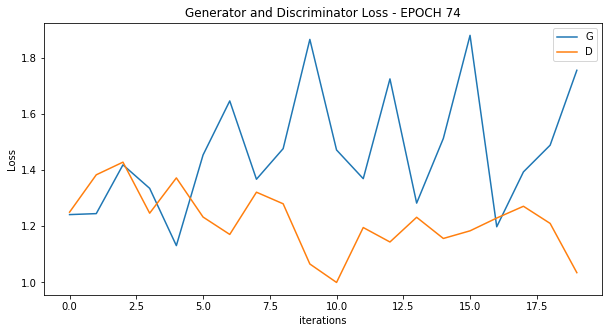

[76/1000][10/20] Loss_D: 1.3286 Loss_G: 1.4495 D(x): 0.5814 D(G(z)): 0.4838 / 0.2191
[76/1000][20/20] Loss_D: 1.2020 Loss_G: 1.5692 D(x): 0.5226 D(G(z)): 0.4002 / 0.1845



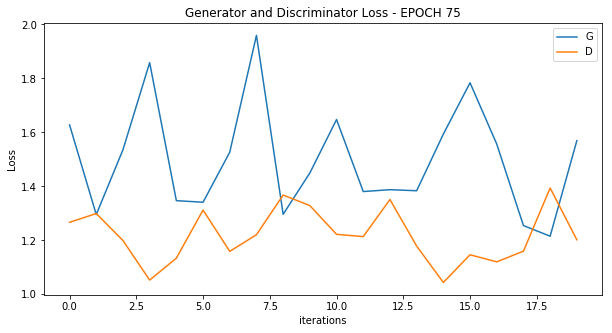

[77/1000][10/20] Loss_D: 1.2343 Loss_G: 1.8521 D(x): 0.5195 D(G(z)): 0.3995 / 0.1550
[77/1000][20/20] Loss_D: 1.3062 Loss_G: 1.6682 D(x): 0.5112 D(G(z)): 0.4386 / 0.1887



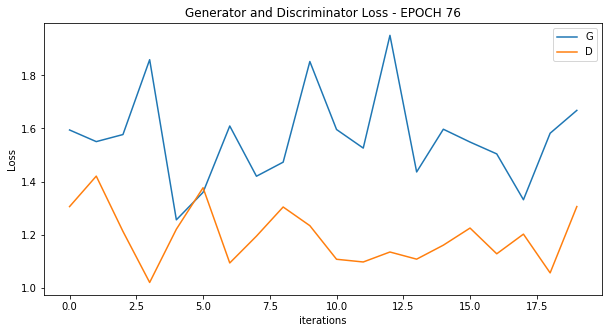

[78/1000][10/20] Loss_D: 1.0769 Loss_G: 1.9818 D(x): 0.6334 D(G(z)): 0.3971 / 0.1290
[78/1000][20/20] Loss_D: 1.3634 Loss_G: 1.8055 D(x): 0.5356 D(G(z)): 0.4385 / 0.1475



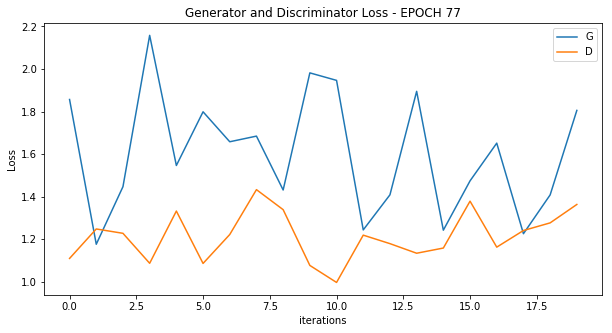

[79/1000][10/20] Loss_D: 1.0215 Loss_G: 1.5728 D(x): 0.4894 D(G(z)): 0.2192 / 0.1985
[79/1000][20/20] Loss_D: 1.1234 Loss_G: 1.6190 D(x): 0.5244 D(G(z)): 0.3298 / 0.1866



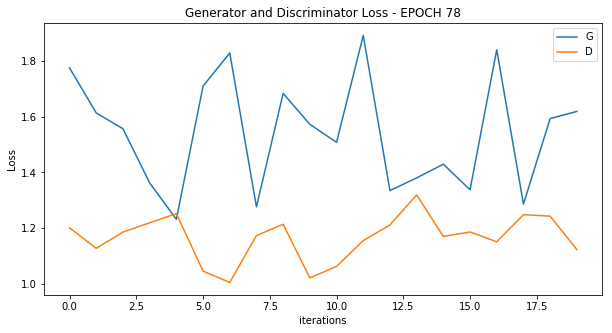

[80/1000][10/20] Loss_D: 1.0289 Loss_G: 1.7204 D(x): 0.5316 D(G(z)): 0.2894 / 0.1686
[80/1000][20/20] Loss_D: 1.2687 Loss_G: 1.4995 D(x): 0.4049 D(G(z)): 0.2777 / 0.2239



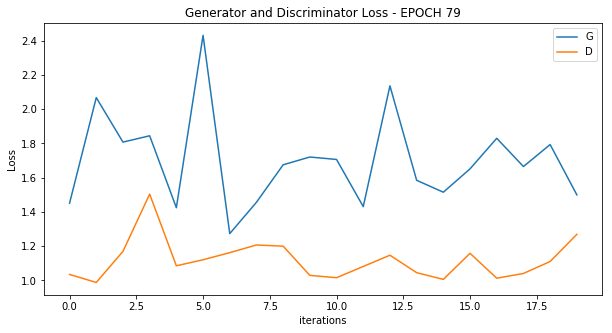

[81/1000][10/20] Loss_D: 1.1996 Loss_G: 1.9356 D(x): 0.6205 D(G(z)): 0.4355 / 0.1525
[81/1000][20/20] Loss_D: 1.4645 Loss_G: 1.1706 D(x): 0.3870 D(G(z)): 0.3627 / 0.3104



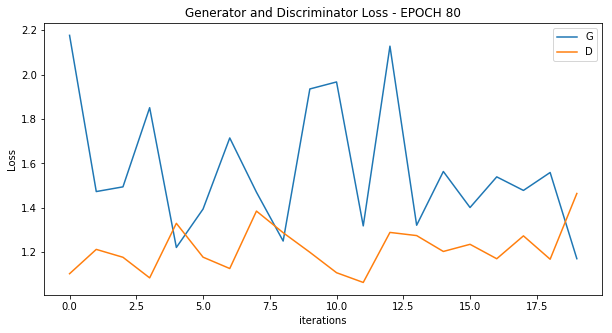

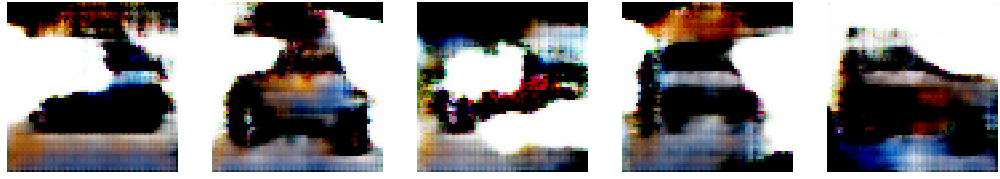

[82/1000][10/20] Loss_D: 0.9245 Loss_G: 1.9910 D(x): 0.6935 D(G(z)): 0.3497 / 0.1281
[82/1000][20/20] Loss_D: 0.9762 Loss_G: 1.7727 D(x): 0.6138 D(G(z)): 0.3397 / 0.1541



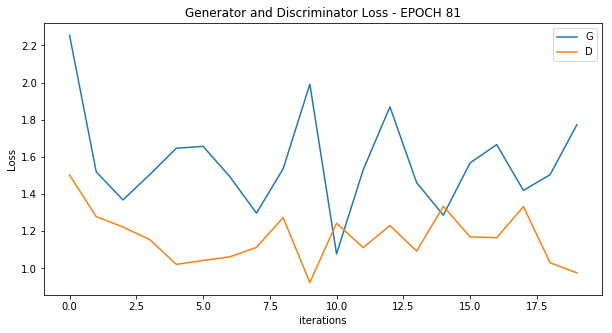

[83/1000][10/20] Loss_D: 1.2999 Loss_G: 1.3655 D(x): 0.4694 D(G(z)): 0.3629 / 0.2651
[83/1000][20/20] Loss_D: 1.2372 Loss_G: 2.2618 D(x): 0.5926 D(G(z)): 0.4585 / 0.0838



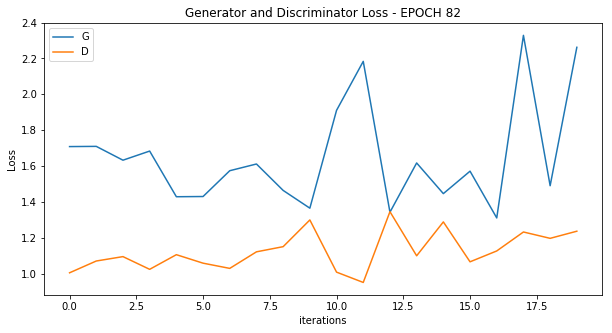

[84/1000][10/20] Loss_D: 1.0555 Loss_G: 1.6506 D(x): 0.6094 D(G(z)): 0.3526 / 0.1782
[84/1000][20/20] Loss_D: 0.9384 Loss_G: 1.8044 D(x): 0.6196 D(G(z)): 0.2939 / 0.1514



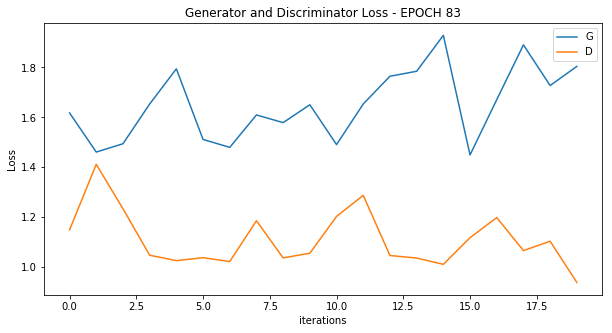

[85/1000][10/20] Loss_D: 1.2795 Loss_G: 2.2302 D(x): 0.6770 D(G(z)): 0.5214 / 0.1050
[85/1000][20/20] Loss_D: 1.0746 Loss_G: 2.3906 D(x): 0.6372 D(G(z)): 0.3808 / 0.0908



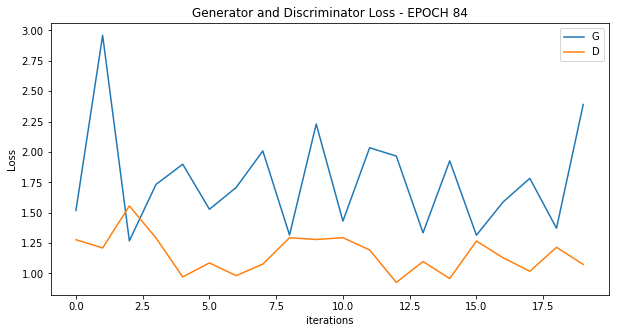

[86/1000][10/20] Loss_D: 1.1292 Loss_G: 1.7697 D(x): 0.5739 D(G(z)): 0.3827 / 0.1522
[86/1000][20/20] Loss_D: 1.0148 Loss_G: 2.3562 D(x): 0.6127 D(G(z)): 0.3311 / 0.0928



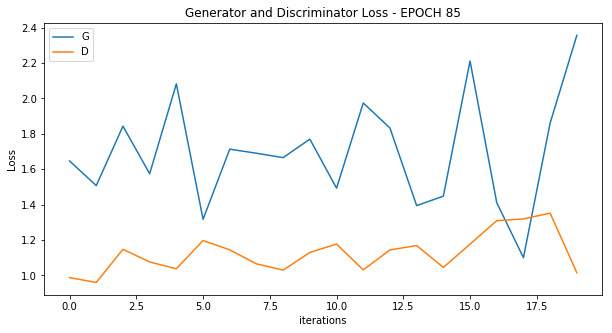

[87/1000][10/20] Loss_D: 1.1649 Loss_G: 1.7173 D(x): 0.5578 D(G(z)): 0.3724 / 0.1734
[87/1000][20/20] Loss_D: 1.4365 Loss_G: 2.1392 D(x): 0.5072 D(G(z)): 0.4433 / 0.1238



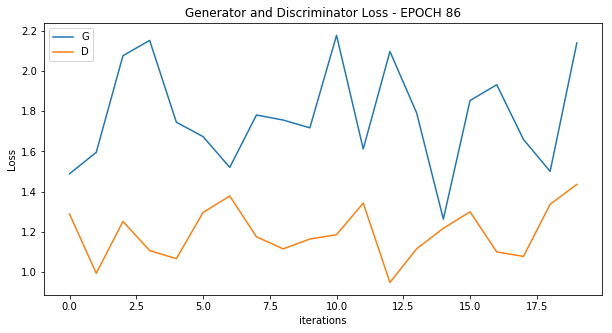

[88/1000][10/20] Loss_D: 1.0159 Loss_G: 1.5631 D(x): 0.5799 D(G(z)): 0.3126 / 0.2016
[88/1000][20/20] Loss_D: 1.1910 Loss_G: 2.1030 D(x): 0.5032 D(G(z)): 0.3193 / 0.1215



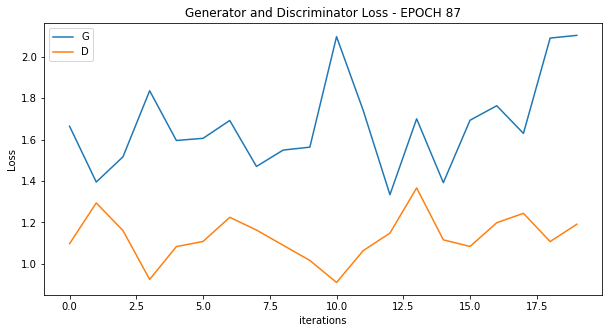

[89/1000][10/20] Loss_D: 1.0492 Loss_G: 1.7777 D(x): 0.5686 D(G(z)): 0.3195 / 0.1676
[89/1000][20/20] Loss_D: 1.0877 Loss_G: 2.6508 D(x): 0.6557 D(G(z)): 0.4263 / 0.0673



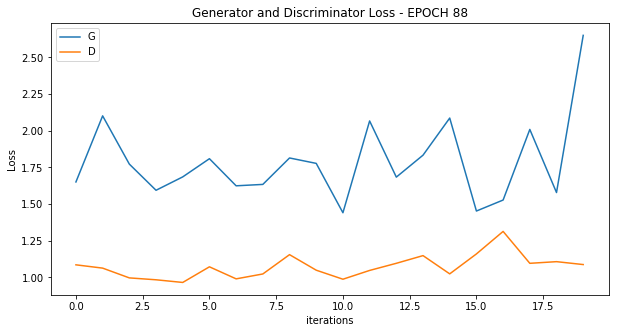

[90/1000][10/20] Loss_D: 1.1944 Loss_G: 1.7093 D(x): 0.4850 D(G(z)): 0.3112 / 0.1720
[90/1000][20/20] Loss_D: 1.2889 Loss_G: 2.1754 D(x): 0.5168 D(G(z)): 0.4152 / 0.1182



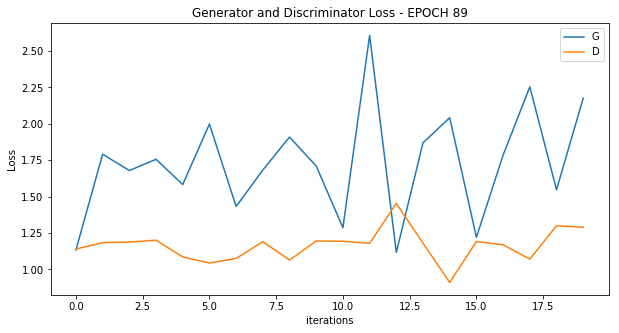

[91/1000][10/20] Loss_D: 1.0412 Loss_G: 1.6659 D(x): 0.5928 D(G(z)): 0.3406 / 0.1832
[91/1000][20/20] Loss_D: 1.1277 Loss_G: 2.7033 D(x): 0.6357 D(G(z)): 0.4249 / 0.0565



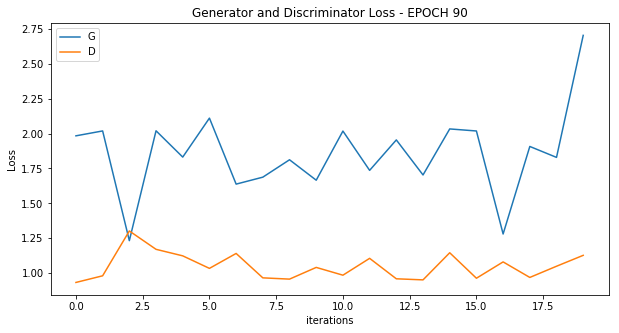

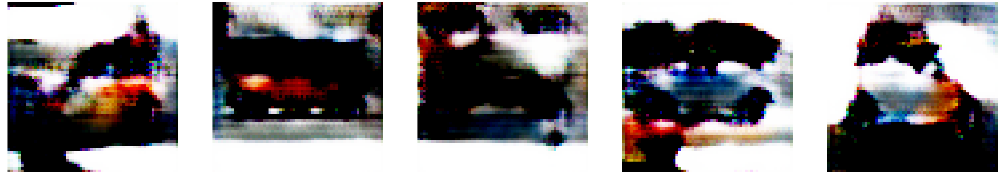

[92/1000][10/20] Loss_D: 1.1896 Loss_G: 1.5613 D(x): 0.5141 D(G(z)): 0.3153 / 0.2066
[92/1000][20/20] Loss_D: 0.9093 Loss_G: 2.3958 D(x): 0.5997 D(G(z)): 0.2538 / 0.0856



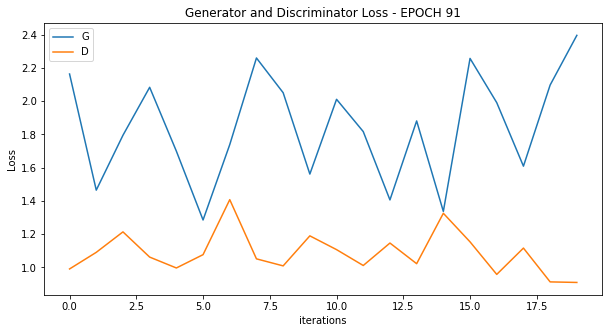

[93/1000][10/20] Loss_D: 1.2315 Loss_G: 1.3474 D(x): 0.4988 D(G(z)): 0.3477 / 0.2520
[93/1000][20/20] Loss_D: 0.9821 Loss_G: 1.9691 D(x): 0.4812 D(G(z)): 0.1811 / 0.1230



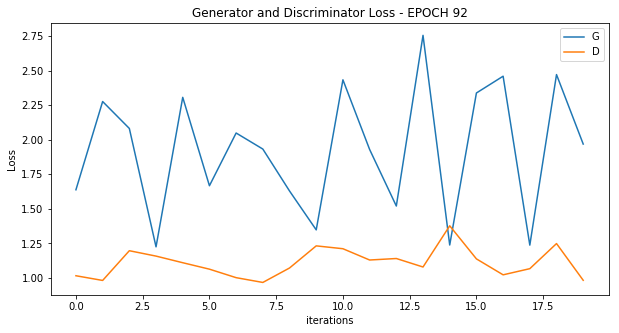

[94/1000][10/20] Loss_D: 1.1376 Loss_G: 1.7425 D(x): 0.5397 D(G(z)): 0.3438 / 0.1615
[94/1000][20/20] Loss_D: 0.9445 Loss_G: 2.1826 D(x): 0.6699 D(G(z)): 0.3447 / 0.0986



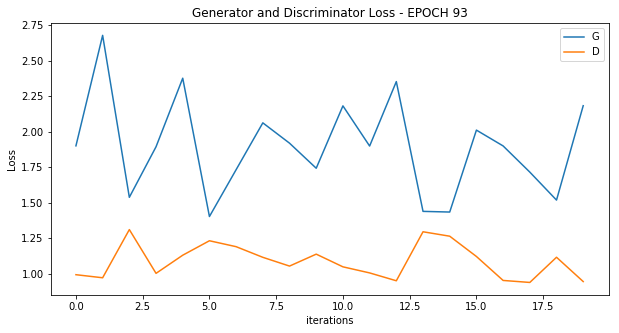

[95/1000][10/20] Loss_D: 0.9904 Loss_G: 2.0534 D(x): 0.5252 D(G(z)): 0.2134 / 0.1337
[95/1000][20/20] Loss_D: 1.2173 Loss_G: 2.5111 D(x): 0.6967 D(G(z)): 0.4807 / 0.0745



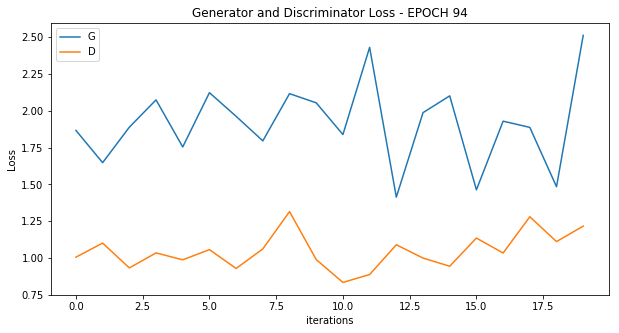

[96/1000][10/20] Loss_D: 1.5014 Loss_G: 1.0160 D(x): 0.3297 D(G(z)): 0.2945 / 0.3635
[96/1000][20/20] Loss_D: 0.9636 Loss_G: 1.9253 D(x): 0.6117 D(G(z)): 0.3084 / 0.1268



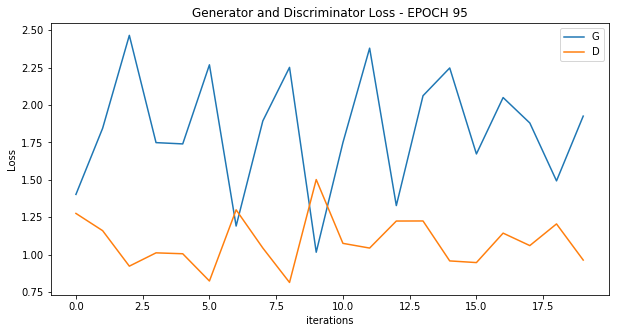

[216/1000][20/20] Loss_D: 0.6247 Loss_G: 3.6750 D(x): 0.8008 D(G(z)): 0.1293 / 0.0285



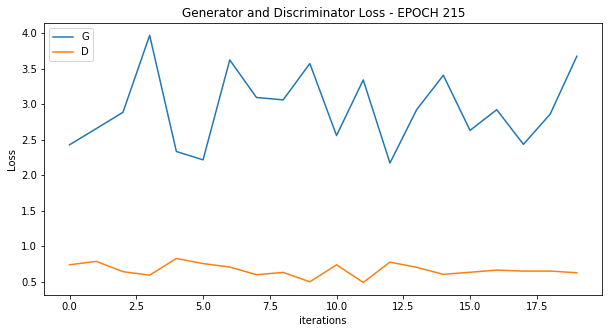

[217/1000][10/20] Loss_D: 0.5982 Loss_G: 3.3034 D(x): 0.7582 D(G(z)): 0.0903 / 0.0340
[217/1000][20/20] Loss_D: 0.4784 Loss_G: 3.9922 D(x): 0.8932 D(G(z)): 0.1043 / 0.0151



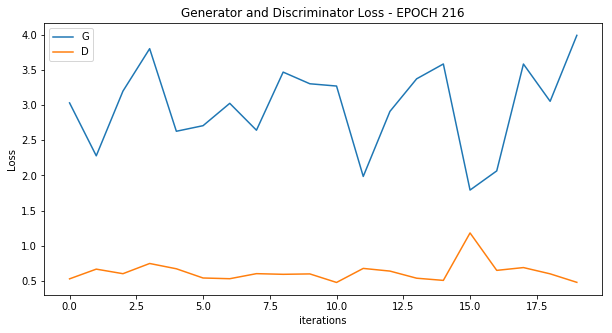

[218/1000][10/20] Loss_D: 0.8746 Loss_G: 2.0368 D(x): 0.5060 D(G(z)): 0.0317 / 0.1430
[218/1000][20/20] Loss_D: 0.7862 Loss_G: 5.2415 D(x): 0.8903 D(G(z)): 0.3019 / 0.0046



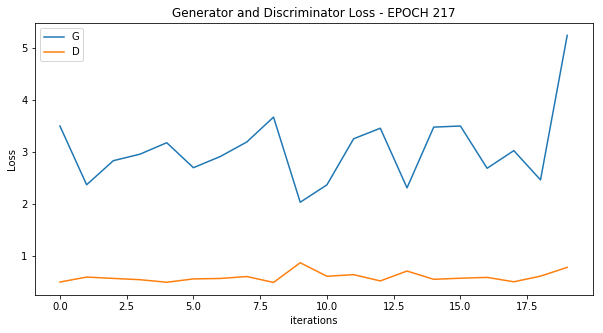

[219/1000][10/20] Loss_D: 0.4358 Loss_G: 3.2607 D(x): 0.8534 D(G(z)): 0.0661 / 0.0307
[219/1000][20/20] Loss_D: 0.6192 Loss_G: 2.5826 D(x): 0.6379 D(G(z)): 0.0455 / 0.0663



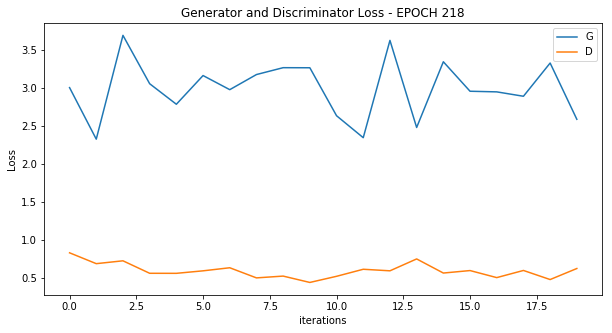

[220/1000][10/20] Loss_D: 0.4894 Loss_G: 3.3382 D(x): 0.8043 D(G(z)): 0.0675 / 0.0386
[220/1000][20/20] Loss_D: 0.6771 Loss_G: 2.7740 D(x): 0.6428 D(G(z)): 0.0864 / 0.0884



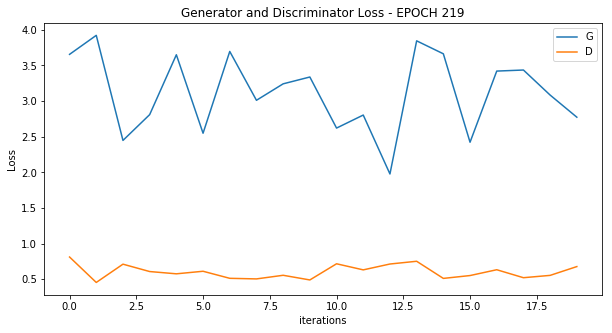

[221/1000][10/20] Loss_D: 0.5659 Loss_G: 3.4507 D(x): 0.8851 D(G(z)): 0.1505 / 0.0305
[221/1000][20/20] Loss_D: 0.5153 Loss_G: 3.3289 D(x): 0.7165 D(G(z)): 0.0493 / 0.0389



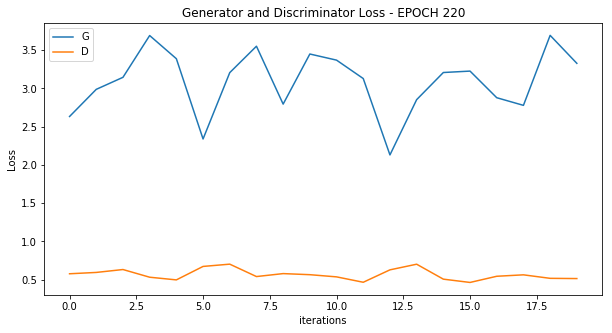

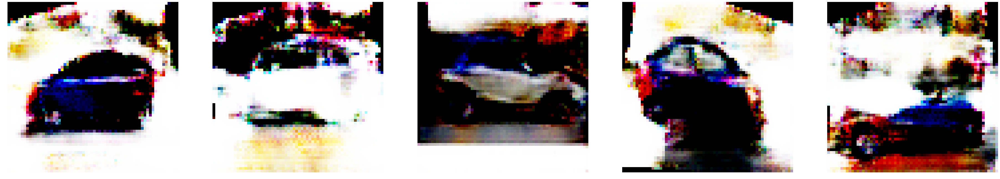

[222/1000][10/20] Loss_D: 0.4761 Loss_G: 3.0095 D(x): 0.8337 D(G(z)): 0.0672 / 0.0461
[222/1000][20/20] Loss_D: 0.7305 Loss_G: 4.1681 D(x): 0.7407 D(G(z)): 0.2264 / 0.0156



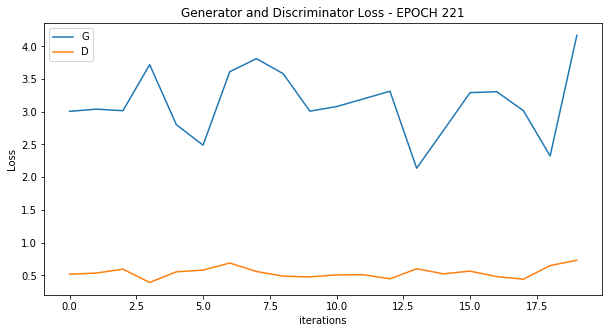

[223/1000][10/20] Loss_D: 0.5892 Loss_G: 2.5083 D(x): 0.7168 D(G(z)): 0.0664 / 0.0924
[223/1000][20/20] Loss_D: 0.7323 Loss_G: 3.7345 D(x): 0.7404 D(G(z)): 0.1230 / 0.0278



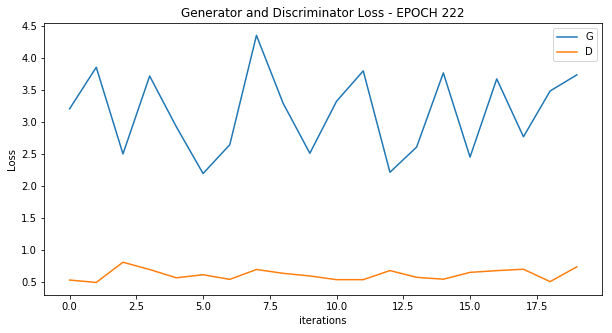

[224/1000][10/20] Loss_D: 0.4227 Loss_G: 3.8361 D(x): 0.8532 D(G(z)): 0.0440 / 0.0194
[224/1000][20/20] Loss_D: 0.6960 Loss_G: 2.5717 D(x): 0.6687 D(G(z)): 0.1336 / 0.0805



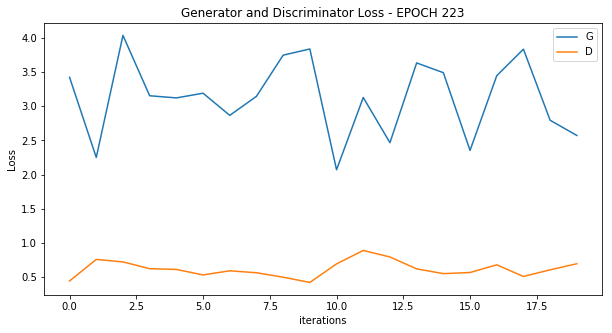

[225/1000][10/20] Loss_D: 0.8025 Loss_G: 1.6965 D(x): 0.5182 D(G(z)): 0.0334 / 0.1987
[225/1000][20/20] Loss_D: 0.5286 Loss_G: 3.6511 D(x): 0.7659 D(G(z)): 0.0868 / 0.0217



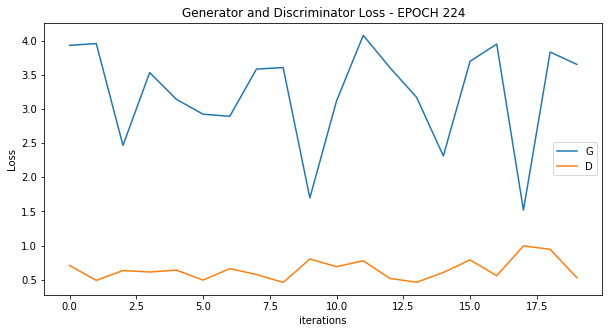

[226/1000][10/20] Loss_D: 0.6337 Loss_G: 2.7366 D(x): 0.7375 D(G(z)): 0.0822 / 0.0696
[460/1000][10/20] Loss_D: 0.4131 Loss_G: 4.3991 D(x): 0.8651 D(G(z)): 0.0363 / 0.0113
[460/1000][20/20] Loss_D: 0.4271 Loss_G: 4.2345 D(x): 0.9049 D(G(z)): 0.0548 / 0.0099



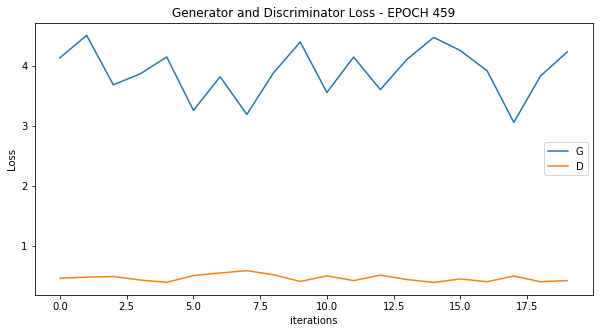

[461/1000][10/20] Loss_D: 0.3994 Loss_G: 4.4973 D(x): 0.8880 D(G(z)): 0.0230 / 0.0110
[461/1000][20/20] Loss_D: 0.4441 Loss_G: 3.1003 D(x): 0.7715 D(G(z)): 0.0276 / 0.0386



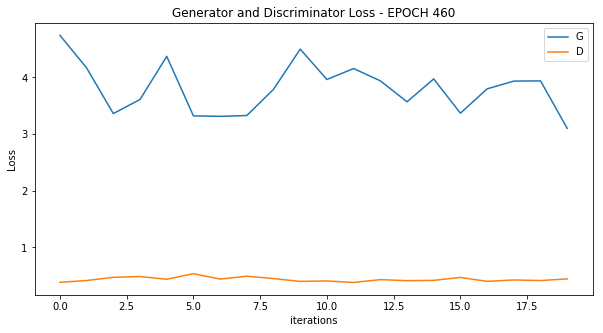

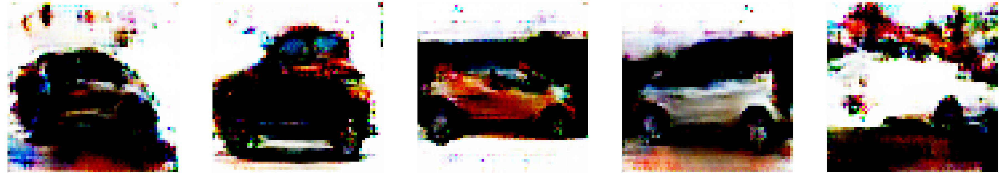

[462/1000][10/20] Loss_D: 0.3958 Loss_G: 4.5993 D(x): 0.9301 D(G(z)): 0.0221 / 0.0089
[462/1000][20/20] Loss_D: 0.4078 Loss_G: 4.2955 D(x): 0.8572 D(G(z)): 0.0211 / 0.0105



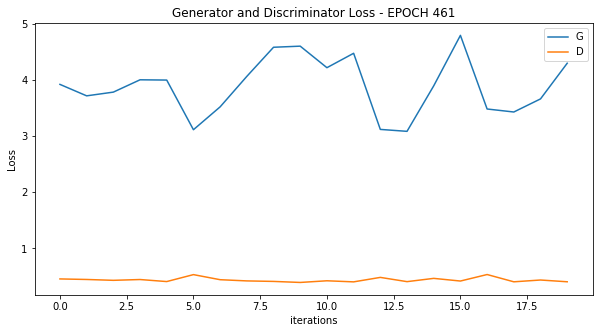

[463/1000][10/20] Loss_D: 0.4411 Loss_G: 3.9317 D(x): 0.8910 D(G(z)): 0.0770 / 0.0175
[463/1000][20/20] Loss_D: 0.8876 Loss_G: 7.0995 D(x): 0.8974 D(G(z)): 0.2596 / 0.0049



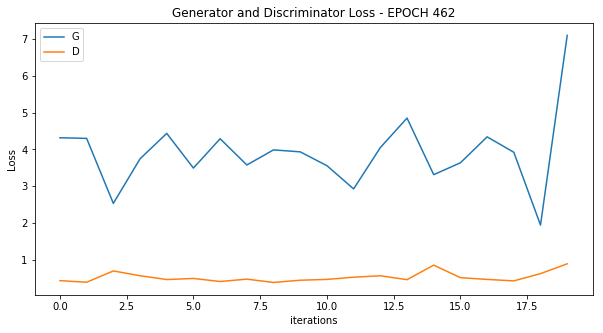

[464/1000][10/20] Loss_D: 0.4193 Loss_G: 4.1626 D(x): 0.8712 D(G(z)): 0.0392 / 0.0184
[464/1000][20/20] Loss_D: 0.6071 Loss_G: 3.2492 D(x): 0.6700 D(G(z)): 0.0446 / 0.0481



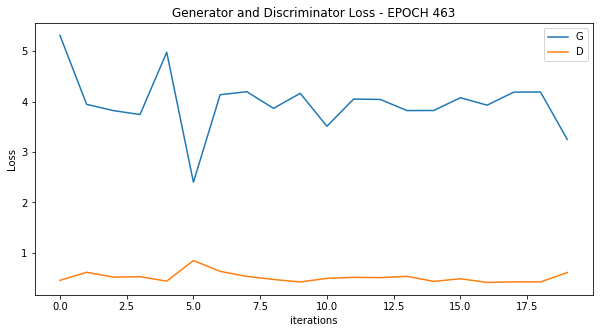

[465/1000][10/20] Loss_D: 0.5627 Loss_G: 3.7125 D(x): 0.9109 D(G(z)): 0.1411 / 0.0220
[465/1000][20/20] Loss_D: 0.4398 Loss_G: 4.5508 D(x): 0.9286 D(G(z)): 0.0568 / 0.0093



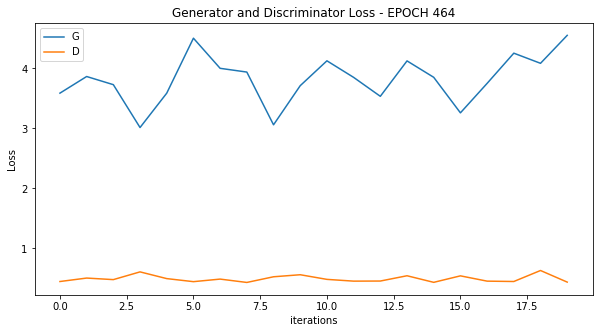

[466/1000][10/20] Loss_D: 0.4146 Loss_G: 3.6540 D(x): 0.8372 D(G(z)): 0.0490 / 0.0240
[466/1000][20/20] Loss_D: 0.5064 Loss_G: 4.4145 D(x): 0.6845 D(G(z)): 0.0062 / 0.0151



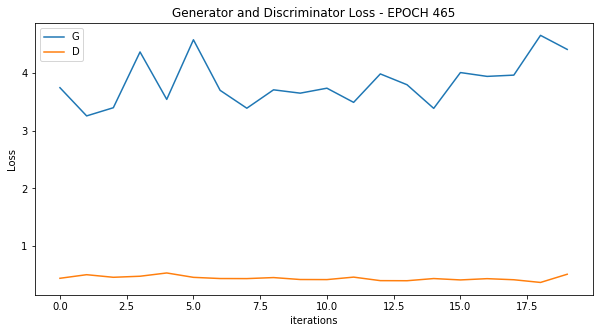

[467/1000][10/20] Loss_D: 0.4040 Loss_G: 3.9702 D(x): 0.9035 D(G(z)): 0.0304 / 0.0171
[467/1000][20/20] Loss_D: 0.4882 Loss_G: 3.5000 D(x): 0.7391 D(G(z)): 0.0242 / 0.0229



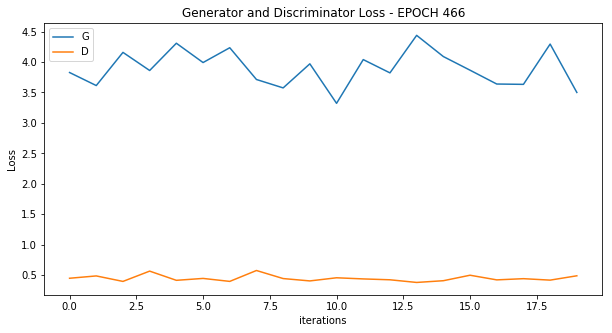

[468/1000][10/20] Loss_D: 0.5287 Loss_G: 3.3817 D(x): 0.8361 D(G(z)): 0.0779 / 0.0330
[468/1000][20/20] Loss_D: 0.5050 Loss_G: 2.4980 D(x): 0.6923 D(G(z)): 0.0350 / 0.0867



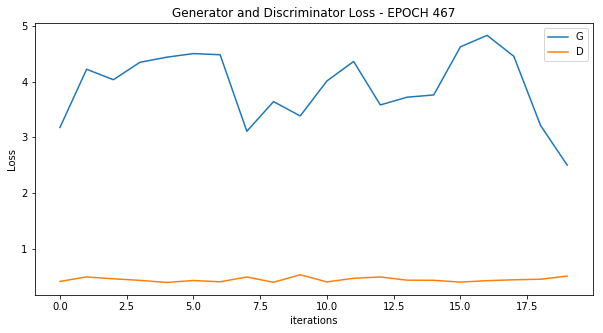

[469/1000][10/20] Loss_D: 0.9278 Loss_G: 2.6890 D(x): 0.5256 D(G(z)): 0.0502 / 0.1245
[469/1000][20/20] Loss_D: 0.5098 Loss_G: 5.7799 D(x): 0.8745 D(G(z)): 0.0851 / 0.0027



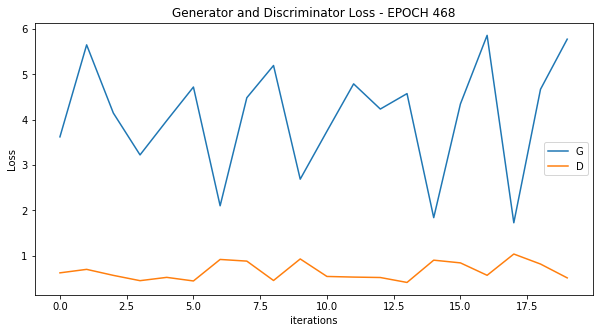

[470/1000][10/20] Loss_D: 0.6185 Loss_G: 3.7089 D(x): 0.9698 D(G(z)): 0.1544 / 0.0224
[470/1000][20/20] Loss_D: 0.4467 Loss_G: 4.2829 D(x): 0.8190 D(G(z)): 0.0590 / 0.0132



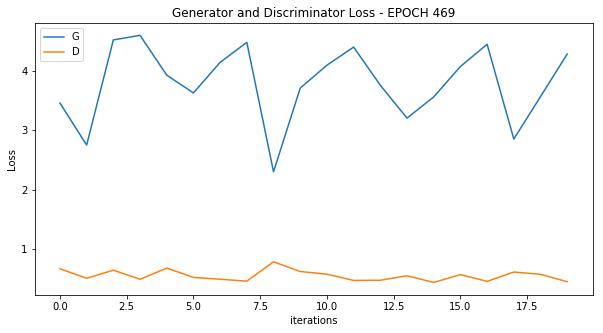

[471/1000][10/20] Loss_D: 0.4518 Loss_G: 3.6893 D(x): 0.8580 D(G(z)): 0.0626 / 0.0274
[471/1000][20/20] Loss_D: 0.5246 Loss_G: 4.3073 D(x): 0.9824 D(G(z)): 0.0388 / 0.0100



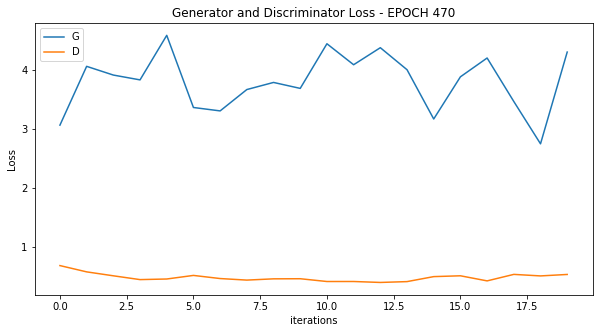

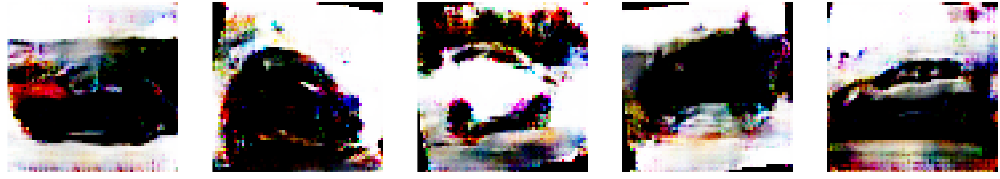

[472/1000][10/20] Loss_D: 0.4731 Loss_G: 3.3129 D(x): 0.7928 D(G(z)): 0.0372 / 0.0430
[472/1000][20/20] Loss_D: 0.6543 Loss_G: 2.2553 D(x): 0.5978 D(G(z)): 0.0187 / 0.1081



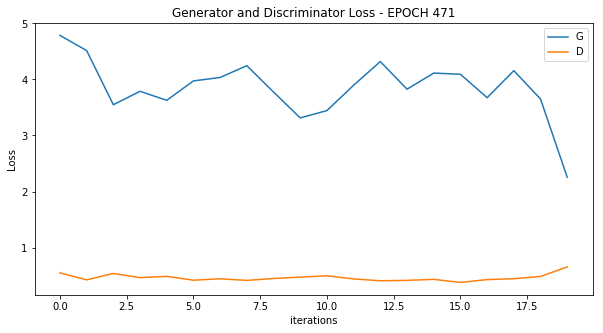

[473/1000][10/20] Loss_D: 0.4247 Loss_G: 4.4210 D(x): 0.8350 D(G(z)): 0.0196 / 0.0145
[473/1000][20/20] Loss_D: 1.1220 Loss_G: 2.1523 D(x): 0.4378 D(G(z)): 0.0151 / 0.1372



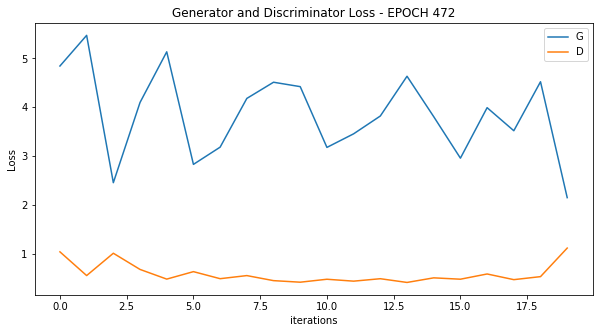

[474/1000][10/20] Loss_D: 0.5104 Loss_G: 4.0537 D(x): 0.9558 D(G(z)): 0.0699 / 0.0177
[474/1000][20/20] Loss_D: 0.5162 Loss_G: 5.3510 D(x): 0.9723 D(G(z)): 0.0751 / 0.0037



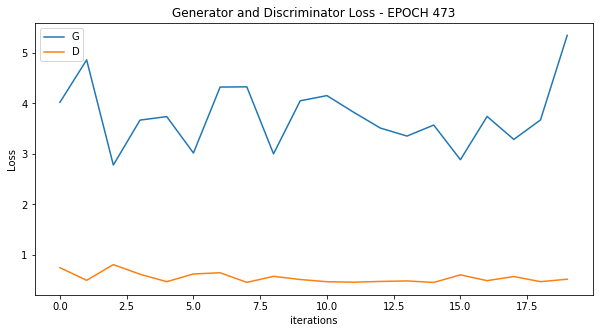

[475/1000][10/20] Loss_D: 0.5029 Loss_G: 4.1072 D(x): 0.9175 D(G(z)): 0.1004 / 0.0161
[475/1000][20/20] Loss_D: 0.5062 Loss_G: 4.8286 D(x): 0.9322 D(G(z)): 0.1151 / 0.0053



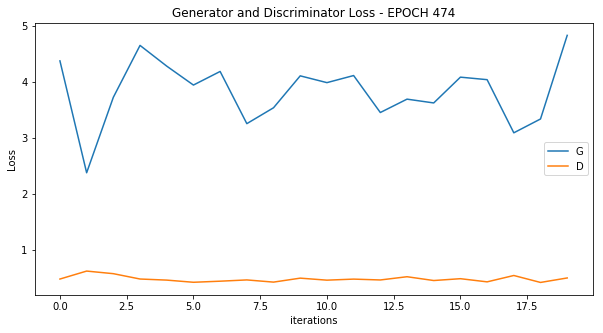

[476/1000][10/20] Loss_D: 0.4139 Loss_G: 3.7795 D(x): 0.8175 D(G(z)): 0.0166 / 0.0223
[476/1000][20/20] Loss_D: 0.4284 Loss_G: 5.0006 D(x): 0.9448 D(G(z)): 0.0265 / 0.0052



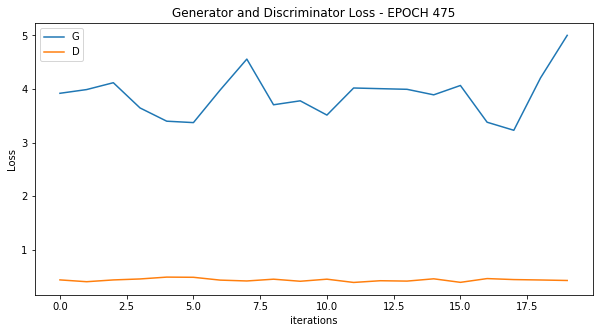

[477/1000][10/20] Loss_D: 0.4460 Loss_G: 3.7380 D(x): 0.7710 D(G(z)): 0.0200 / 0.0261
[477/1000][20/20] Loss_D: 0.6996 Loss_G: 2.8481 D(x): 0.6032 D(G(z)): 0.0105 / 0.0708



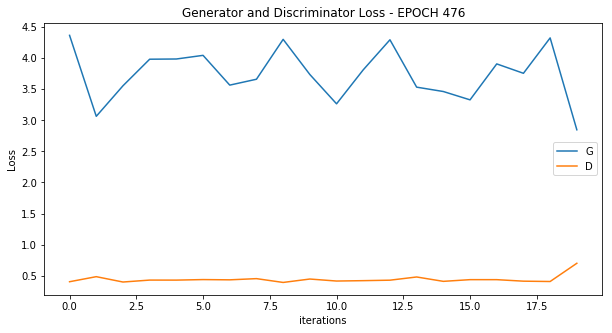

[478/1000][10/20] Loss_D: 0.3854 Loss_G: 4.3805 D(x): 0.9259 D(G(z)): 0.0249 / 0.0121
[478/1000][20/20] Loss_D: 0.3923 Loss_G: 4.5007 D(x): 0.8703 D(G(z)): 0.0184 / 0.0103



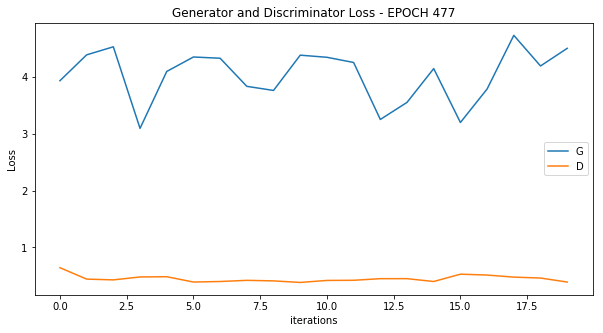

[479/1000][10/20] Loss_D: 0.4064 Loss_G: 4.4570 D(x): 0.9240 D(G(z)): 0.0241 / 0.0114
[479/1000][20/20] Loss_D: 0.4767 Loss_G: 4.1445 D(x): 0.9146 D(G(z)): 0.0753 / 0.0144



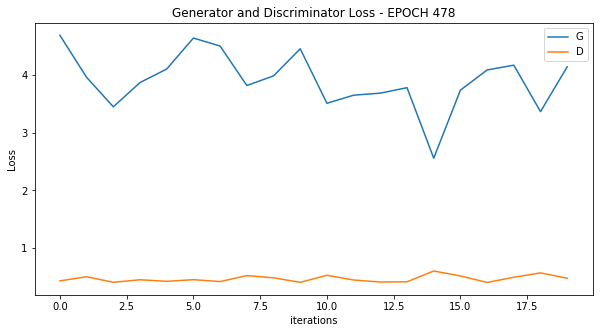

[703/1000][20/20] Loss_D: 0.4223 Loss_G: 3.3089 D(x): 0.7940 D(G(z)): 0.0316 / 0.0286



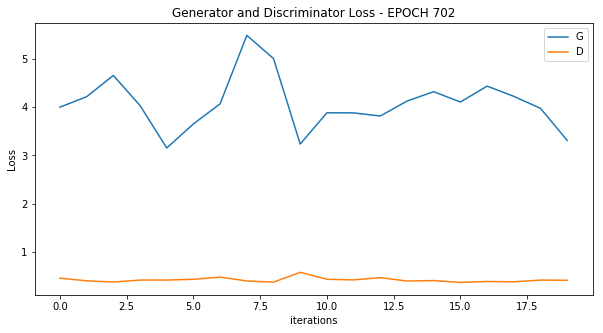

[704/1000][10/20] Loss_D: 0.4267 Loss_G: 4.7120 D(x): 0.8907 D(G(z)): 0.0469 / 0.0097
[704/1000][20/20] Loss_D: 0.4547 Loss_G: 3.3980 D(x): 0.7575 D(G(z)): 0.0117 / 0.0386



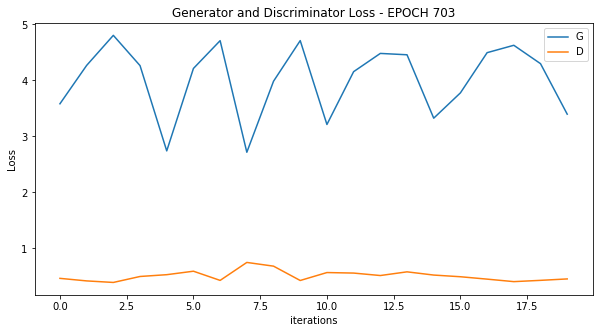

[705/1000][10/20] Loss_D: 0.5084 Loss_G: 3.5375 D(x): 0.9478 D(G(z)): 0.0959 / 0.0247
[705/1000][20/20] Loss_D: 0.4035 Loss_G: 4.8284 D(x): 0.8778 D(G(z)): 0.0102 / 0.0068



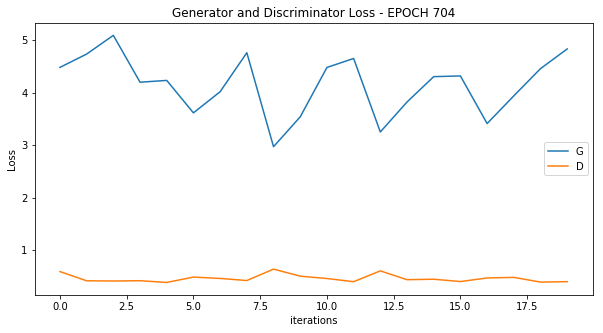

[706/1000][10/20] Loss_D: 0.4553 Loss_G: 3.8593 D(x): 0.9350 D(G(z)): 0.0652 / 0.0222
[706/1000][20/20] Loss_D: 0.4036 Loss_G: 5.6259 D(x): 0.9490 D(G(z)): 0.0061 / 0.0029



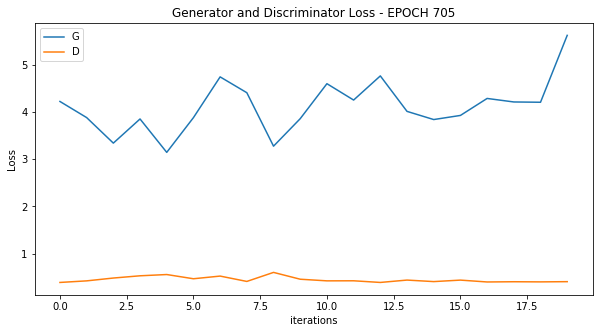

[707/1000][10/20] Loss_D: 0.4226 Loss_G: 4.3039 D(x): 0.8702 D(G(z)): 0.0237 / 0.0146
[707/1000][20/20] Loss_D: 0.4200 Loss_G: 3.7019 D(x): 0.8516 D(G(z)): 0.0212 / 0.0184



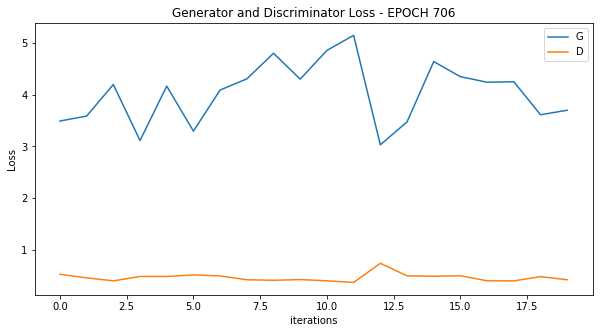

[708/1000][10/20] Loss_D: 0.3969 Loss_G: 4.6575 D(x): 0.9051 D(G(z)): 0.0219 / 0.0088
[708/1000][20/20] Loss_D: 0.5351 Loss_G: 5.6352 D(x): 0.9432 D(G(z)): 0.1317 / 0.0063



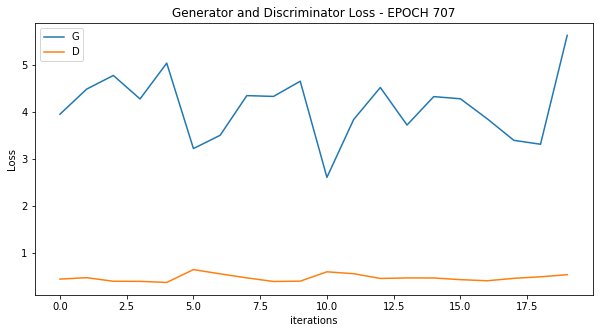

[709/1000][10/20] Loss_D: 0.4537 Loss_G: 3.7499 D(x): 0.9045 D(G(z)): 0.0790 / 0.0221
[709/1000][20/20] Loss_D: 0.3958 Loss_G: 4.6382 D(x): 0.9312 D(G(z)): 0.0142 / 0.0068



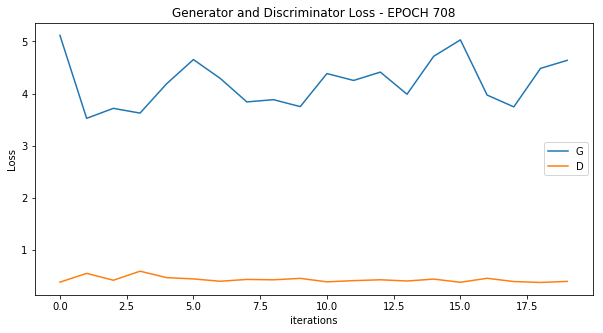

[710/1000][10/20] Loss_D: 0.5124 Loss_G: 4.0634 D(x): 0.9675 D(G(z)): 0.1005 / 0.0148
[710/1000][20/20] Loss_D: 0.4852 Loss_G: 4.8451 D(x): 0.9442 D(G(z)): 0.1038 / 0.0070



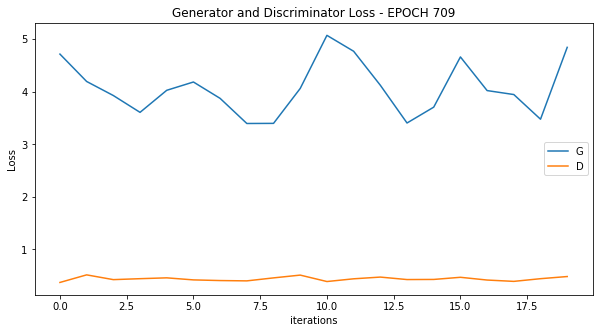

[711/1000][10/20] Loss_D: 0.4001 Loss_G: 3.7043 D(x): 0.8926 D(G(z)): 0.0293 / 0.0277
[711/1000][20/20] Loss_D: 0.3637 Loss_G: 5.4986 D(x): 0.9041 D(G(z)): 0.0073 / 0.0040



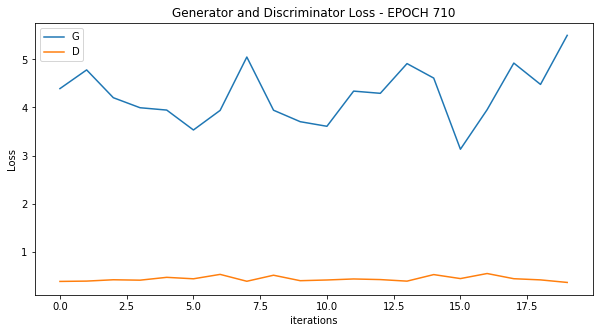

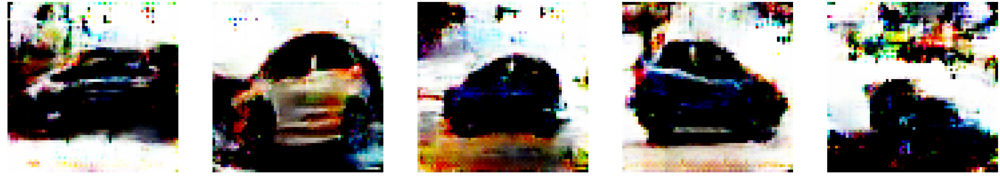

[712/1000][10/20] Loss_D: 0.4239 Loss_G: 4.7424 D(x): 0.9633 D(G(z)): 0.0265 / 0.0072
[712/1000][20/20] Loss_D: 0.4608 Loss_G: 5.4318 D(x): 0.9778 D(G(z)): 0.0339 / 0.0030



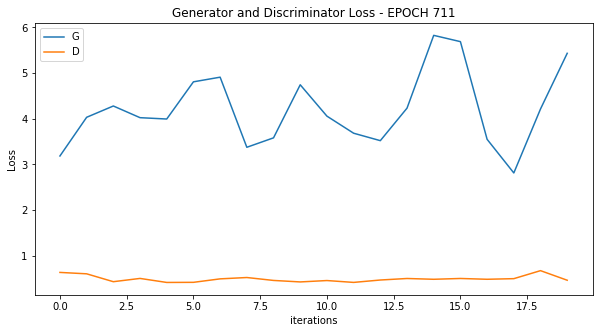

[713/1000][10/20] Loss_D: 0.4313 Loss_G: 4.1749 D(x): 0.9580 D(G(z)): 0.0305 / 0.0136
[713/1000][20/20] Loss_D: 0.4536 Loss_G: 4.7817 D(x): 0.9118 D(G(z)): 0.0628 / 0.0067



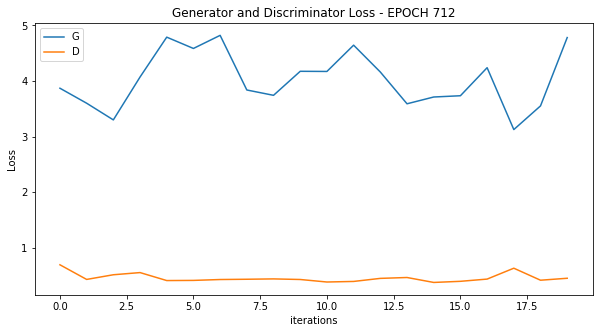

[714/1000][10/20] Loss_D: 0.4063 Loss_G: 3.8015 D(x): 0.9145 D(G(z)): 0.0345 / 0.0215
[714/1000][20/20] Loss_D: 0.4760 Loss_G: 4.4984 D(x): 0.8959 D(G(z)): 0.0962 / 0.0077



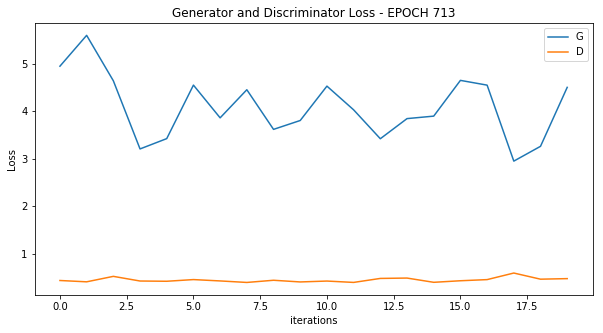

[715/1000][10/20] Loss_D: 0.3739 Loss_G: 4.8091 D(x): 0.9230 D(G(z)): 0.0197 / 0.0077
[715/1000][20/20] Loss_D: 0.3739 Loss_G: 4.7235 D(x): 0.9287 D(G(z)): 0.0123 / 0.0065



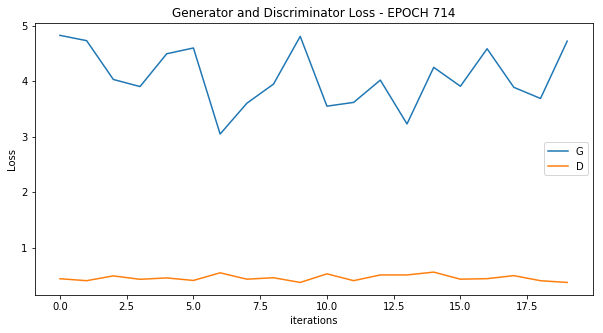

[716/1000][10/20] Loss_D: 0.4528 Loss_G: 4.1667 D(x): 0.9625 D(G(z)): 0.0519 / 0.0139
[716/1000][20/20] Loss_D: 0.4006 Loss_G: 4.5933 D(x): 0.7743 D(G(z)): 0.0069 / 0.0085



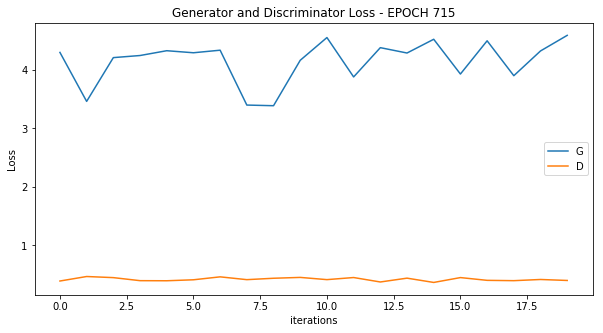

[717/1000][10/20] Loss_D: 0.3866 Loss_G: 4.0525 D(x): 0.8960 D(G(z)): 0.0165 / 0.0152
[717/1000][20/20] Loss_D: 0.4971 Loss_G: 3.9355 D(x): 0.7652 D(G(z)): 0.0175 / 0.0192



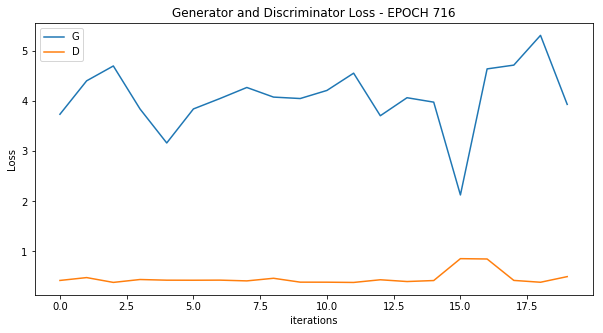

[718/1000][10/20] Loss_D: 0.3864 Loss_G: 4.3707 D(x): 0.8881 D(G(z)): 0.0105 / 0.0114
[718/1000][20/20] Loss_D: 0.4387 Loss_G: 4.2485 D(x): 0.7681 D(G(z)): 0.0119 / 0.0134



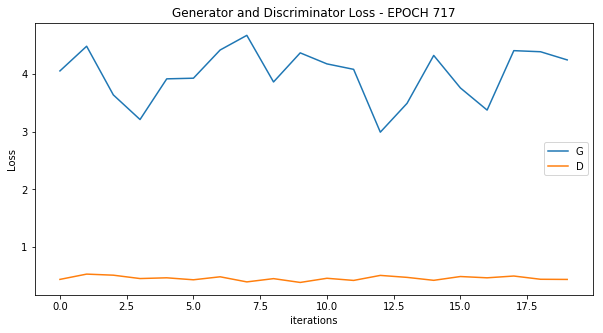

[719/1000][10/20] Loss_D: 0.5493 Loss_G: 4.0958 D(x): 0.9062 D(G(z)): 0.1030 / 0.0146
[719/1000][20/20] Loss_D: 0.5215 Loss_G: 4.1077 D(x): 0.7393 D(G(z)): 0.0525 / 0.0210



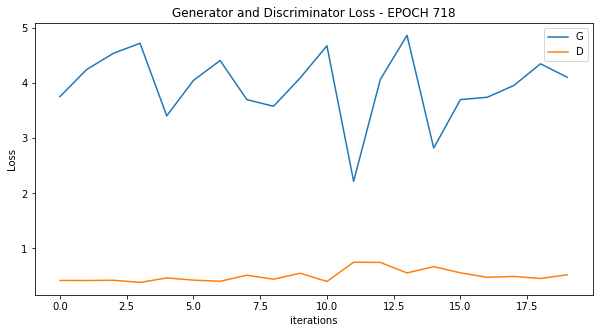

[720/1000][10/20] Loss_D: 0.4941 Loss_G: 4.0700 D(x): 0.9699 D(G(z)): 0.0695 / 0.0149
[720/1000][20/20] Loss_D: 0.4509 Loss_G: 4.6172 D(x): 0.9150 D(G(z)): 0.0472 / 0.0093



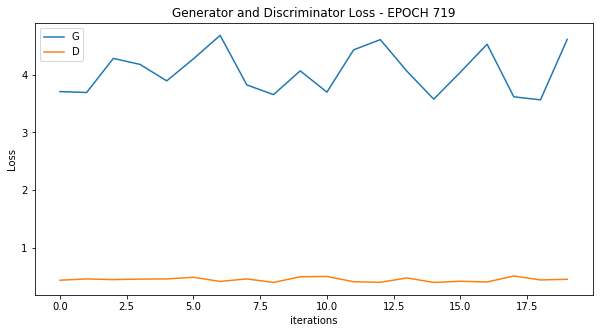

[721/1000][10/20] Loss_D: 0.4383 Loss_G: 4.2110 D(x): 0.8598 D(G(z)): 0.0349 / 0.0136
[721/1000][20/20] Loss_D: 0.4112 Loss_G: 4.3953 D(x): 0.8916 D(G(z)): 0.0523 / 0.0103



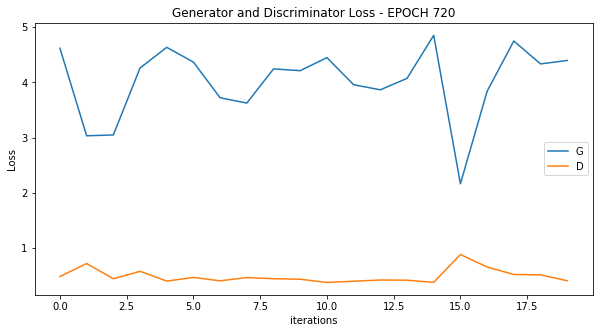

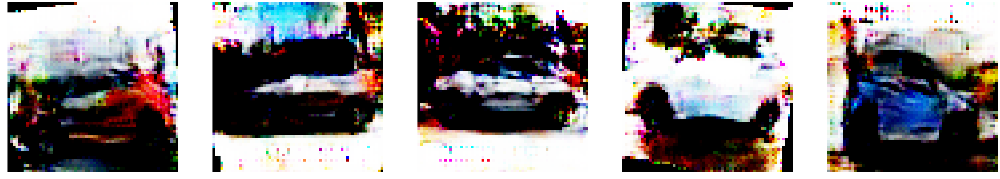

[722/1000][10/20] Loss_D: 0.4234 Loss_G: 4.0879 D(x): 0.8331 D(G(z)): 0.0255 / 0.0210
[722/1000][20/20] Loss_D: 0.4287 Loss_G: 4.7277 D(x): 0.9174 D(G(z)): 0.0407 / 0.0063



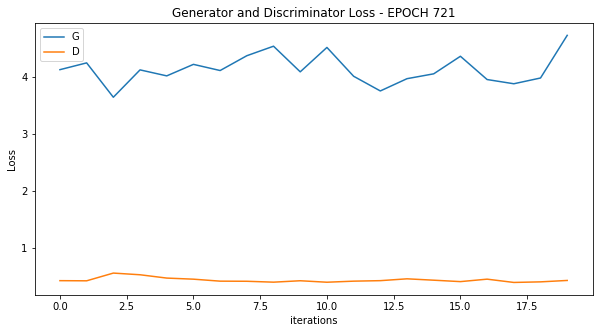

[949/1000][10/20] Loss_D: 0.4618 Loss_G: 3.9549 D(x): 0.8806 D(G(z)): 0.0751 / 0.0165
[949/1000][20/20] Loss_D: 0.3755 Loss_G: 4.4657 D(x): 0.9007 D(G(z)): 0.0124 / 0.0088



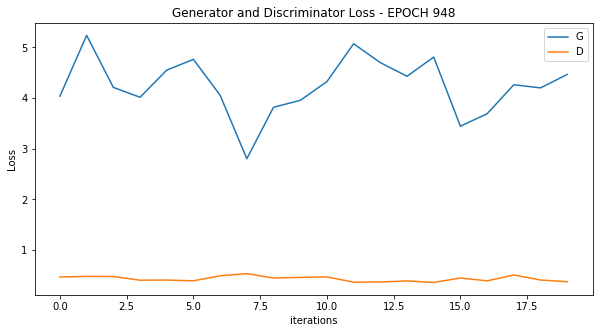

[950/1000][10/20] Loss_D: 0.5100 Loss_G: 3.5887 D(x): 0.9829 D(G(z)): 0.0551 / 0.0289
[950/1000][20/20] Loss_D: 0.3635 Loss_G: 4.8119 D(x): 0.8967 D(G(z)): 0.0088 / 0.0058



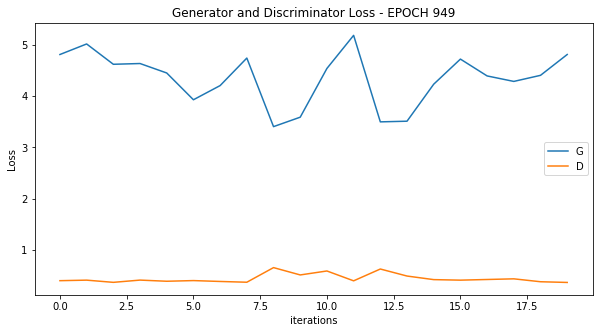

[951/1000][10/20] Loss_D: 0.5063 Loss_G: 4.4944 D(x): 0.9809 D(G(z)): 0.0496 / 0.0099
[951/1000][20/20] Loss_D: 0.5871 Loss_G: 3.1002 D(x): 0.6681 D(G(z)): 0.0213 / 0.0455



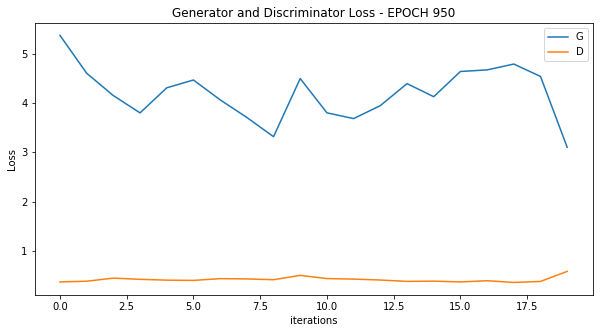

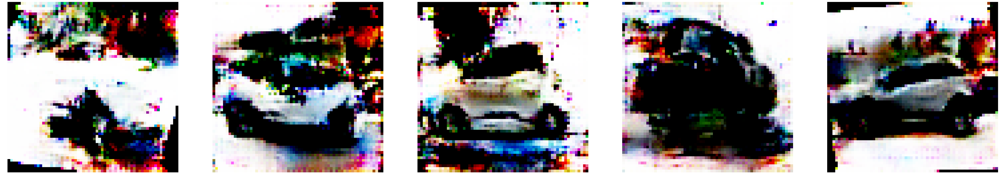

[952/1000][10/20] Loss_D: 0.8061 Loss_G: 4.6222 D(x): 0.9776 D(G(z)): 0.2222 / 0.0077
[952/1000][20/20] Loss_D: 0.4063 Loss_G: 3.7068 D(x): 0.8459 D(G(z)): 0.0340 / 0.0226



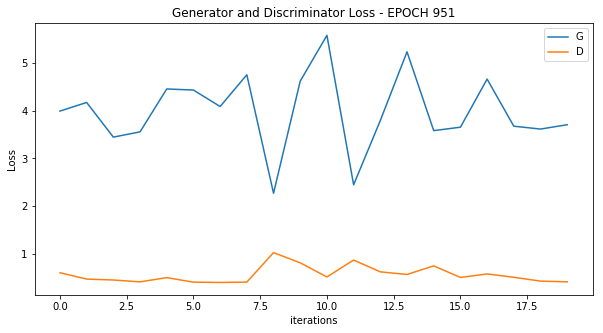

[953/1000][10/20] Loss_D: 0.4817 Loss_G: 4.5433 D(x): 0.9798 D(G(z)): 0.0378 / 0.0103
[953/1000][20/20] Loss_D: 0.4209 Loss_G: 3.6730 D(x): 0.8210 D(G(z)): 0.0248 / 0.0257



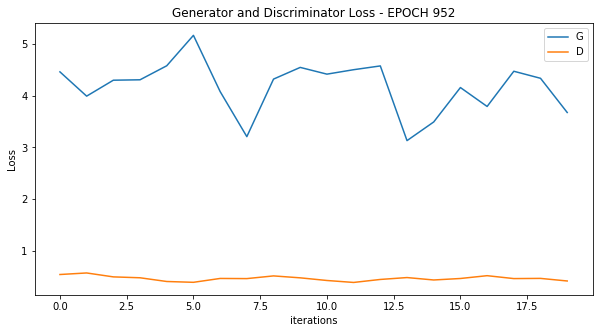

[954/1000][10/20] Loss_D: 0.4440 Loss_G: 3.8506 D(x): 0.7468 D(G(z)): 0.0128 / 0.0229
[954/1000][20/20] Loss_D: 0.4984 Loss_G: 4.5959 D(x): 0.9479 D(G(z)): 0.0699 / 0.0074



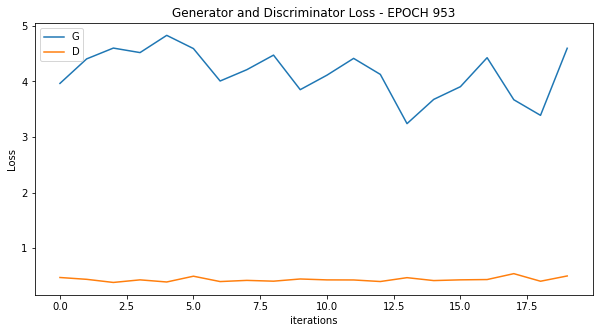

[955/1000][10/20] Loss_D: 0.3758 Loss_G: 4.1204 D(x): 0.9156 D(G(z)): 0.0237 / 0.0152
[955/1000][20/20] Loss_D: 0.4744 Loss_G: 3.8267 D(x): 0.8181 D(G(z)): 0.0128 / 0.0163



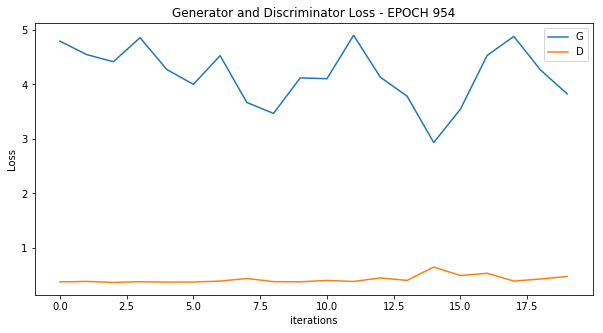

[956/1000][10/20] Loss_D: 0.3912 Loss_G: 3.5281 D(x): 0.8940 D(G(z)): 0.0225 / 0.0250
[956/1000][20/20] Loss_D: 0.5221 Loss_G: 3.8755 D(x): 0.7736 D(G(z)): 0.0444 / 0.0177



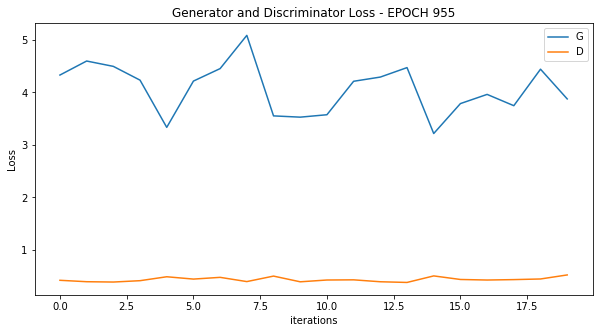

[957/1000][10/20] Loss_D: 0.4778 Loss_G: 4.2461 D(x): 0.9122 D(G(z)): 0.0834 / 0.0159
[957/1000][20/20] Loss_D: 0.5003 Loss_G: 3.6870 D(x): 0.9670 D(G(z)): 0.0367 / 0.0186



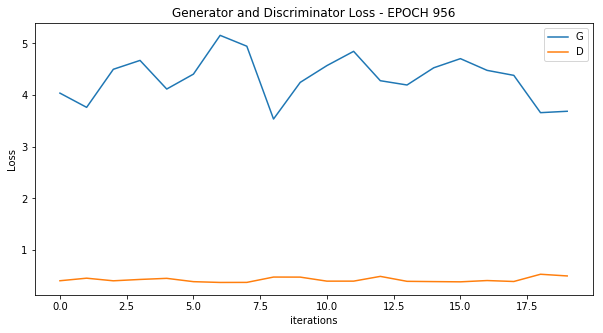

[958/1000][10/20] Loss_D: 0.3978 Loss_G: 4.3288 D(x): 0.9430 D(G(z)): 0.0175 / 0.0133
[958/1000][20/20] Loss_D: 0.4105 Loss_G: 5.1141 D(x): 0.9351 D(G(z)): 0.0167 / 0.0048



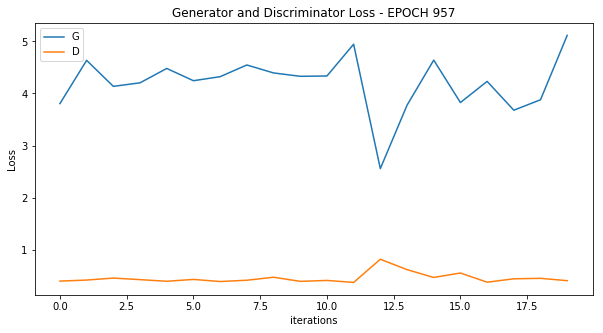

[959/1000][10/20] Loss_D: 0.3956 Loss_G: 4.3416 D(x): 0.9371 D(G(z)): 0.0347 / 0.0121
[959/1000][20/20] Loss_D: 0.4287 Loss_G: 4.6808 D(x): 0.9713 D(G(z)): 0.0131 / 0.0081



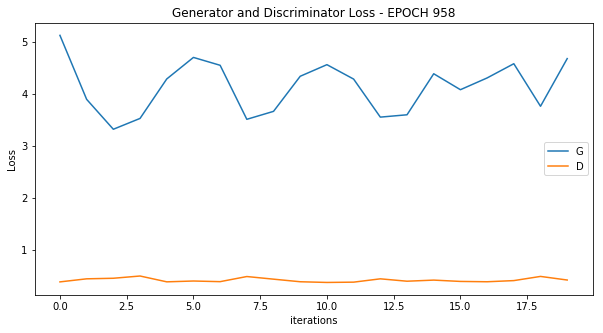

[960/1000][10/20] Loss_D: 0.4010 Loss_G: 4.3427 D(x): 0.9414 D(G(z)): 0.0249 / 0.0115
[960/1000][20/20] Loss_D: 0.4340 Loss_G: 4.3157 D(x): 0.8273 D(G(z)): 0.0176 / 0.0111



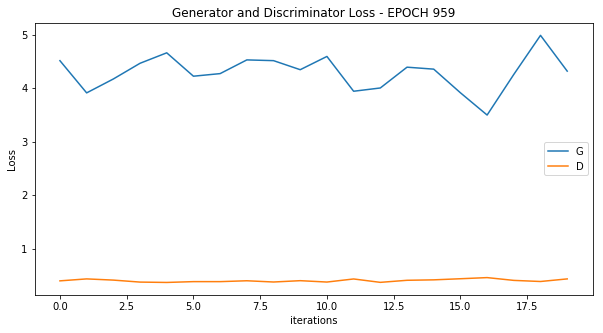

[961/1000][10/20] Loss_D: 0.3727 Loss_G: 4.9722 D(x): 0.8954 D(G(z)): 0.0165 / 0.0077
[961/1000][20/20] Loss_D: 0.3527 Loss_G: 5.0853 D(x): 0.8718 D(G(z)): 0.0050 / 0.0042



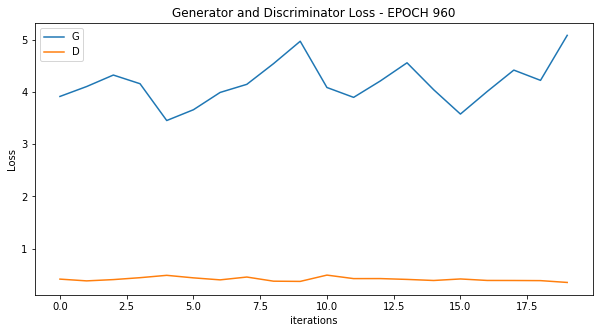

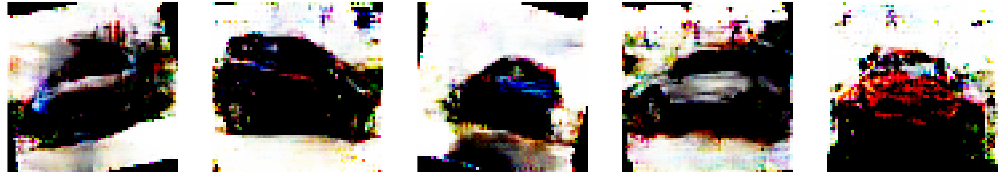

[962/1000][10/20] Loss_D: 0.4020 Loss_G: 3.4059 D(x): 0.8866 D(G(z)): 0.0432 / 0.0318
[962/1000][20/20] Loss_D: 0.3714 Loss_G: 4.9738 D(x): 0.8754 D(G(z)): 0.0058 / 0.0052



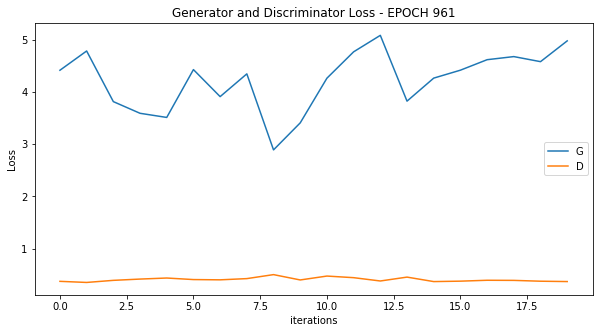

[963/1000][10/20] Loss_D: 0.4306 Loss_G: 4.0648 D(x): 0.8323 D(G(z)): 0.0382 / 0.0177
[963/1000][20/20] Loss_D: 0.5446 Loss_G: 3.6694 D(x): 0.6848 D(G(z)): 0.0237 / 0.0343



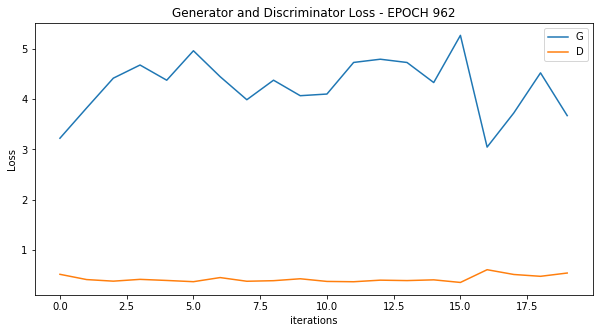

[964/1000][10/20] Loss_D: 0.3971 Loss_G: 4.5868 D(x): 0.9223 D(G(z)): 0.0327 / 0.0092
[964/1000][20/20] Loss_D: 0.4373 Loss_G: 5.2244 D(x): 0.9460 D(G(z)): 0.0572 / 0.0038



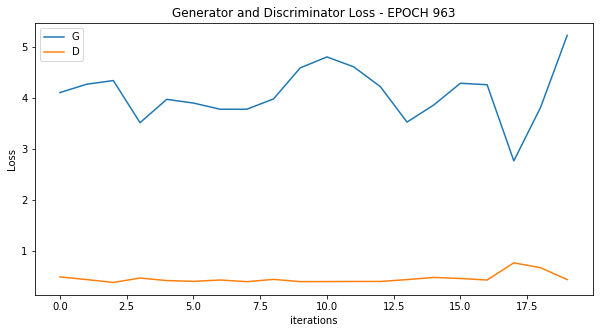

[965/1000][10/20] Loss_D: 0.3899 Loss_G: 4.8113 D(x): 0.8672 D(G(z)): 0.0125 / 0.0075
[965/1000][20/20] Loss_D: 0.4090 Loss_G: 3.7536 D(x): 0.9019 D(G(z)): 0.0458 / 0.0168



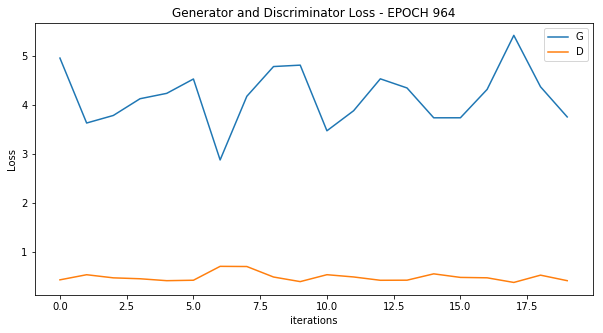

[966/1000][10/20] Loss_D: 0.4174 Loss_G: 4.8861 D(x): 0.9296 D(G(z)): 0.0196 / 0.0067
[966/1000][20/20] Loss_D: 0.3798 Loss_G: 5.0365 D(x): 0.9186 D(G(z)): 0.0091 / 0.0051



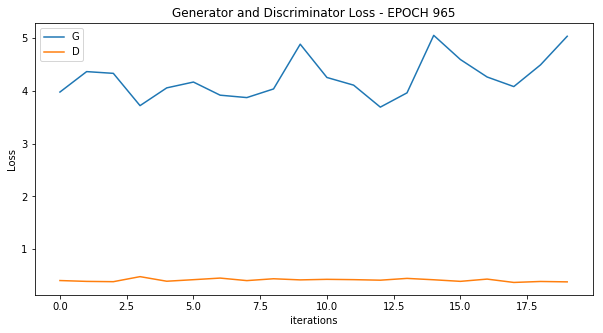

[967/1000][10/20] Loss_D: 0.3902 Loss_G: 4.4168 D(x): 0.8544 D(G(z)): 0.0179 / 0.0137
[967/1000][20/20] Loss_D: 0.3536 Loss_G: 5.5261 D(x): 0.9230 D(G(z)): 0.0103 / 0.0039



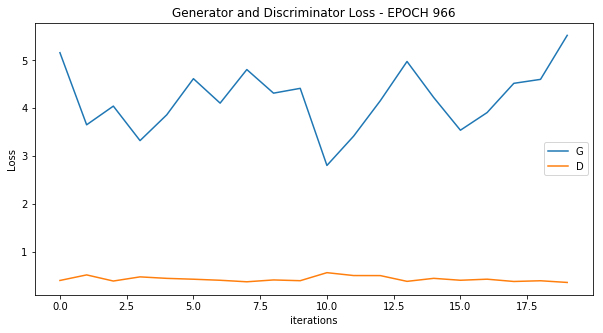

[968/1000][10/20] Loss_D: 0.4156 Loss_G: 4.2134 D(x): 0.9391 D(G(z)): 0.0407 / 0.0132
[968/1000][20/20] Loss_D: 0.4867 Loss_G: 4.6534 D(x): 0.9778 D(G(z)): 0.0311 / 0.0064



In [15]:
for epoch in range(epochs):
    
    start = time.time()
    for ii, (real_images, train_labels) in tqdm(enumerate(train_loader), total=len(train_loader)):
        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        # train with real
        netD.zero_grad()
        real_images = real_images.to(device)
        batch_size = real_images.size(0)
        labels = torch.full((batch_size, 1), real_label, device=device)

        output = netD(real_images)
        errD_real = criterion(output, labels)
        errD_real.backward()
        D_x = output.mean().item()

        # train with fake
        noise = torch.randn(batch_size, nz, 1, 1, device=device)
        fake = netG(noise)
        labels.fill_(fake_label)
        output = netD(fake.detach())
        errD_fake = criterion(output, labels)
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        errD = errD_real + errD_fake
        optimizerD.step()

        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        netG.zero_grad()
        labels.fill_(real_label)  # fake labels are real for generator cost
        output = netD(fake)
        errG = criterion(output, labels)
        errG.backward()
        D_G_z2 = output.mean().item()
        optimizerG.step()
        
        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())
        
        if (ii+1) % (len(train_loader)//2) == 0:
            print('[%d/%d][%d/%d] Loss_D: %.4f Loss_G: %.4f D(x): %.4f D(G(z)): %.4f / %.4f'
                  % (epoch + 1, epochs, ii+1, len(train_loader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))
            
    plot_loss (G_losses, D_losses, epoch)
    G_losses = []
    D_losses = []
    if epoch % 10 == 0:
        show_generated_img()

    epoch_time.append(time.time()- start)
    
#             valid_image = netG(fixed_noise)

In [16]:
print (">> average EPOCH duration = ", np.mean(epoch_time))

>> average EPOCH duration =  2.054169233083725


# Generation example

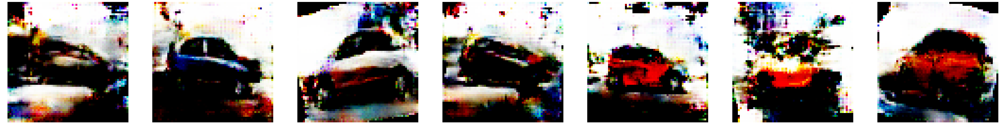

In [17]:
show_generated_img(7)

In [18]:
if not os.path.exists('../output_images'):
    os.mkdir('../output_images')
    
im_batch_size = 50
n_images=10000

for i_batch in tqdm(range(0, n_images, im_batch_size)):
    gen_z = torch.randn(im_batch_size, nz, 1, 1, device=device)
    gen_images = netG(gen_z)
    images = gen_images.to("cpu").clone().detach()
    images = images.numpy().transpose(0, 2, 3, 1)
    for i_image in range(gen_images.size(0)):
        save_image(gen_images[i_image, :, :, :], os.path.join('../output_images', f'image_{i_batch+i_image:05d}.png'))

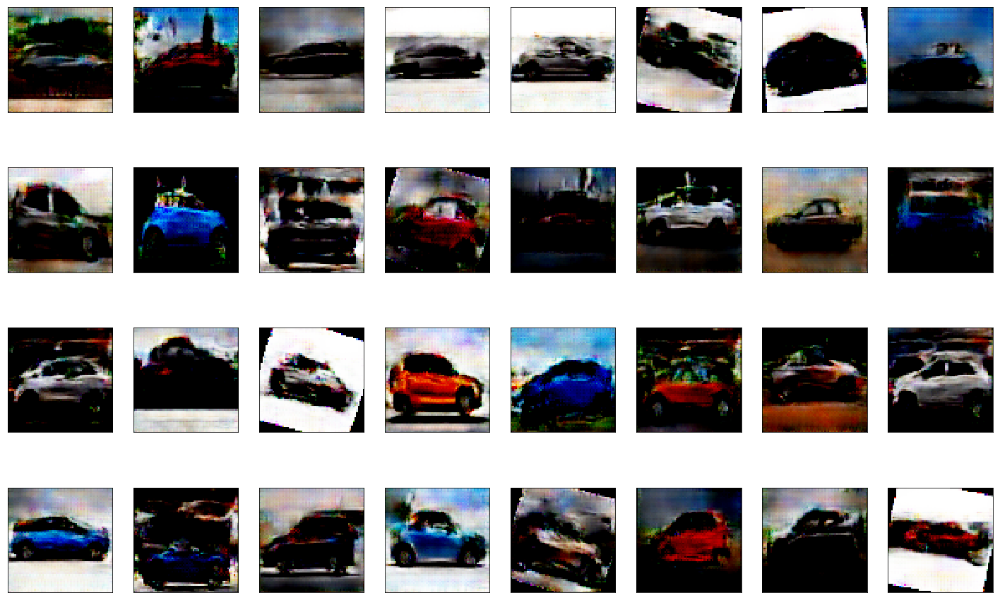

In [19]:
fig = plt.figure(figsize=(25, 16))
# display 10 images from each class
for i, j in enumerate(images[:32]):
    ax = fig.add_subplot(4, 8, i + 1, xticks=[], yticks=[])
    plt.imshow(j)

### Save models

In [20]:
torch.save(netG.state_dict(), 'generator.pth')
torch.save(netD.state_dict(), 'discriminator.pth')

In [21]:
# !ls ../output_images